# AV Behavior with friction implementation in icy weather

In [1]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats
from scipy.stats import norm, binom, poisson
from dtaidistance import dtw
import json

## Testing Parameters

In [2]:
weather_param = [[20,0,0,70,0,10,0,10,10],
    [20,0,0,70,0,30,0,10,30],
    [20,0,0,70,0,70,0,10,70],
    [20,0,0,70,0,100,0,10,100]] 


def calc_fric(weather_list):
    return np.exp(-1.89711*weather_list[-1]/100) * (1-weather_list[-1]/100)**3 * 0.85 + 0.15

for i in range(len(weather_param)):
    friction_ratio = calc_fric(weather_param[i])
    weather_param[i] += [friction_ratio]

df = pd.DataFrame(weather_param, columns =["cloudiness","precipitation","precipitation_deposits","sun_altitude_angle","sun_azimuth_angle","wetness","fog_density","wind_intensity", "ice_thickness", "friction_ratio"],
) 
# df.index.name = 'Scenarios'
df

,cloudiness,precipitation,precipitation_deposits,sun_altitude_angle,sun_azimuth_angle,wetness,fog_density,wind_intensity,ice_thickness,friction_ratio
0,20,0,0,70,0,10,0,10,10,0.662573
1,20,0,0,70,0,30,0,10,30,0.315022
2,20,0,0,70,0,70,0,10,70,0.156082
3,20,0,0,70,0,100,0,10,100,0.150000


### With reduced friction

In [3]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [4]:
rel_path = "./Data/Front Accident/Icy Reduced Friction Exponential"
os.path.isdir(rel_path)

True

In [5]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-noon-icy-100_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-10_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-30_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-70_fi_front_accidient',
 'route_highway_epoch24_clear-noon_fi_front_accidient']

In [6]:
subfolders[-1], subfolders[0] = subfolders[0], subfolders[-1]

subfolders

['route_highway_epoch24_clear-noon_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-10_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-30_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-70_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-100_fi_front_accidient']

In [7]:
txt_lists_fric = [[] for i in range(5)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [8]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 23.650000352412462,
     'duration_system': 44.857401609420776,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [9]:
avg_complete_fric = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_fric}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-noon_fi_front_accidient,1.00
1,route_highway_epoch24_clear-noon-icy-10_fi_front_accidient,0.03
2,route_highway_epoch24_clear-noon-icy-30_fi_front_accidient,1.00
3,route_highway_epoch24_clear-noon-icy-70_fi_front_accidient,1.00
4,route_highway_epoch24_clear-noon-icy-100_fi_front_accidient,1.00


In [10]:
count = 0

avg_score_fric = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_fric}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-noon_fi_front_accidient,100.000000
1,route_highway_epoch24_clear-noon-icy-10_fi_front_accidient,60.367608
2,route_highway_epoch24_clear-noon-icy-30_fi_front_accidient,100.000000
3,route_highway_epoch24_clear-noon-icy-70_fi_front_accidient,100.000000
4,route_highway_epoch24_clear-noon-icy-100_fi_front_accidient,100.000000


#### Setting up into list of DataFrames

In [11]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [12]:
df_array_fric = np.empty((5,100), dtype=object)

for i in range(len(df_array_fric)):
    for j in range((len(df_array_fric[i]))):
        df_array_fric[i][j] = pd.DataFrame()

In [13]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_fric[i][run_index] = df
            run_index += 1

./Data/Front Accident/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon_fi_front_accidient
./Data/Front Accident/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-10_fi_front_accidient
./Data/Front Accident/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-30_fi_front_accidient
./Data/Front Accident/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-70_fi_front_accidient
./Data/Front Accident/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-100_fi_front_accidient


In [14]:
df_array_fric[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,6457684,0,0.900000,-0.001098,0.0,6457684,0,501.097173,198.767441,-59.832653,-499.823944,6457684,0,192.362411,-86.262680,0.534733,0.000000
1,6457685,0,0.900000,-0.003739,0.0,6457685,0,13.812594,195.567444,-72.832657,0.100000,6457685,0,192.362411,-86.262680,0.487313,0.000000
2,6457686,0,0.900000,-0.004184,0.0,6457686,0,13.811309,195.567444,-72.832657,0.095407,6457686,0,192.362411,-86.262680,0.433781,0.000000
3,6457687,0,0.900000,-0.003478,0.0,6457687,0,13.810197,195.567444,-72.832657,0.084691,6457687,0,192.362411,-86.262680,0.374139,0.000000
4,6457688,0,0.900000,-0.008337,0.0,6457688,0,13.809258,195.567444,-72.832657,0.067854,6457688,0,192.362411,-86.262680,0.308388,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,6458427,0,0.437149,0.002739,0.0,6458427,0,31.663903,189.271347,74.562370,-0.036357,6458427,0,193.253159,43.149830,-0.021201,9.319516
744,6458428,0,0.525425,0.001368,0.0,6458428,0,31.531547,189.239990,74.658356,-0.036265,6458428,0,193.250702,43.382927,-0.021200,9.326176
745,6458429,0,0.542300,0.003397,0.0,6458429,0,31.397342,189.208252,74.752495,-0.036227,6458429,0,193.248337,43.616173,-0.021196,9.331609
746,6458430,0,0.587572,0.003820,0.0,6458430,0,31.261234,189.176270,74.844727,-0.036233,6458430,0,193.246033,43.849541,-0.021192,9.336287


In [15]:
df_array_fric[0][0]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
940    193.126007
941    193.121658
942    193.117493
943    193.113571
944    193.109940
Name: x, Length: 945, dtype: float64

### Without friction reduction

In [16]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [17]:
rel_path = "./Data/Front Accident/Icy Original/"
os.path.isdir(rel_path)

True

In [18]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-noon-icy-100_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-10_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-30_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-70_fi_front_accidient',
 'route_highway_epoch24_clear-noon_fi_front_accidient']

In [19]:
subfolders[0], subfolders[-1] = subfolders[-1], subfolders[0]
subfolders

['route_highway_epoch24_clear-noon_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-10_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-30_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-70_fi_front_accidient',
 'route_highway_epoch24_clear-noon-icy-100_fi_front_accidient']

In [20]:
txt_lists_fric = [[] for i in range(5)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [21]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 23.650000352412462,
     'duration_system': 44.10415029525757,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [22]:
avg_complete_orig = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_orig}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-noon_fi_front_accidient,1.0
1,route_highway_epoch24_clear-noon-icy-10_fi_front_accidient,1.0
2,route_highway_epoch24_clear-noon-icy-30_fi_front_accidient,1.0
3,route_highway_epoch24_clear-noon-icy-70_fi_front_accidient,1.0
4,route_highway_epoch24_clear-noon-icy-100_fi_front_accidient,1.0


In [23]:
count = 0

avg_score_orig = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_orig}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-noon_fi_front_accidient,100.0
1,route_highway_epoch24_clear-noon-icy-10_fi_front_accidient,100.0
2,route_highway_epoch24_clear-noon-icy-30_fi_front_accidient,100.0
3,route_highway_epoch24_clear-noon-icy-70_fi_front_accidient,100.0
4,route_highway_epoch24_clear-noon-icy-100_fi_front_accidient,100.0


#### Setting up into list of DataFrames

In [24]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [25]:
df_array_orig = np.empty((5,100), dtype=object)

for i in range(len(df_array_orig)):
    for j in range((len(df_array_orig[i]))):
        df_array_orig[i][j] = pd.DataFrame()

In [26]:
rel_path = "./Data/Front Accident/Icy Original/"

In [27]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_orig[i][run_index] = df
            run_index += 1

./Data/Front Accident/Icy Original/route_highway_epoch24_clear-noon_fi_front_accidient
./Data/Front Accident/Icy Original/route_highway_epoch24_clear-noon-icy-10_fi_front_accidient
./Data/Front Accident/Icy Original/route_highway_epoch24_clear-noon-icy-30_fi_front_accidient
./Data/Front Accident/Icy Original/route_highway_epoch24_clear-noon-icy-70_fi_front_accidient
./Data/Front Accident/Icy Original/route_highway_epoch24_clear-noon-icy-100_fi_front_accidient


In [28]:
df_array_orig[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,1545251,0,0.900000,-0.001319,0.0,1545251,0,501.097173,198.767441,-59.832653,-499.823944,1545251,0,192.362411,-86.262680,0.534733,0.000000
1,1545252,0,0.900000,-0.003691,0.0,1545252,0,13.812594,195.567444,-72.832657,0.100000,1545252,0,192.362411,-86.262680,0.487313,0.000000
2,1545253,0,0.900000,-0.004616,0.0,1545253,0,13.811309,195.567444,-72.832657,0.095407,1545253,0,192.362411,-86.262680,0.433781,0.000000
3,1545254,0,0.900000,-0.004034,0.0,1545254,0,13.810197,195.567444,-72.832657,0.084691,1545254,0,192.362411,-86.262680,0.374139,0.000000
4,1545255,0,0.900000,-0.008498,0.0,1545255,0,13.809258,195.567444,-72.832657,0.067854,1545255,0,192.362411,-86.262680,0.308388,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
950,1546201,0,0.428611,0.000816,0.0,1546201,0,39.768385,192.931747,82.950752,-0.040814,1546201,0,193.252151,43.183662,-0.021183,9.334432
951,1546202,0,0.483930,0.002039,0.0,1546202,0,39.797014,192.934082,83.212868,-0.040793,1546202,0,193.249298,43.417107,-0.021182,9.339629
952,1546203,0,0.537896,0.003474,0.0,1546203,0,39.825429,192.936264,83.474854,-0.040768,1546203,0,193.246582,43.650639,-0.021179,9.342767
953,1546204,0,0.602280,0.002951,0.0,1546204,0,39.853602,192.938278,83.736656,-0.040740,1546204,0,193.243958,43.884232,-0.021174,9.345068


In [29]:
df_array_orig[2][1]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
938    193.174026
939    193.169724
940    193.165558
941    193.161591
942    193.157822
Name: x, Length: 943, dtype: float64

## Comparing completion rate and scores

In [30]:
subfolders = ['clear-noon-icy-0_front_accident',
 'clear-noon-icy-10_front_accident',
 'clear-noon-icy-30_front_accident',
 'clear-noon-icy-70_front_accident',
 'clear-noon-icy-100_front_accident']

In [31]:
print(avg_score_orig)
print(avg_score_fric)
print(avg_complete_orig)
print(avg_complete_fric)

vertical_dict = {'Weather Parameter':subfolders, 'Average Completion Rate Original Friction': avg_score_orig, 'Average Completion Rate Reduced Friction': avg_score_fric, 'Average Score Rate Original Friction': [i*100 for i in avg_complete_orig], 'Average Score Rate Reduced Friction': [i*100 for i in avg_complete_fric]} 
    
df = pd.DataFrame(vertical_dict)
    
df 

[100.0, 100.0, 100.0, 100.0, 100.0]
[100.0, 60.36760827895997, 100.0, 100.0, 100.0]
[1.0, 1.0, 1.0, 1.0, 1.0]
[1.0, 0.03, 1.0, 1.0, 1.0]


,Weather Parameter,Average Completion Rate Original Friction,Average Completion Rate Reduced Friction,Average Score Rate Original Friction,Average Score Rate Reduced Friction
0,clear-noon-icy-0_front_accident,100.0,100.000000,100.0,100.0
1,clear-noon-icy-10_front_accident,100.0,60.367608,100.0,3.0
2,clear-noon-icy-30_front_accident,100.0,100.000000,100.0,100.0
3,clear-noon-icy-70_front_accident,100.0,100.000000,100.0,100.0
4,clear-noon-icy-100_front_accident,100.0,100.000000,100.0,100.0


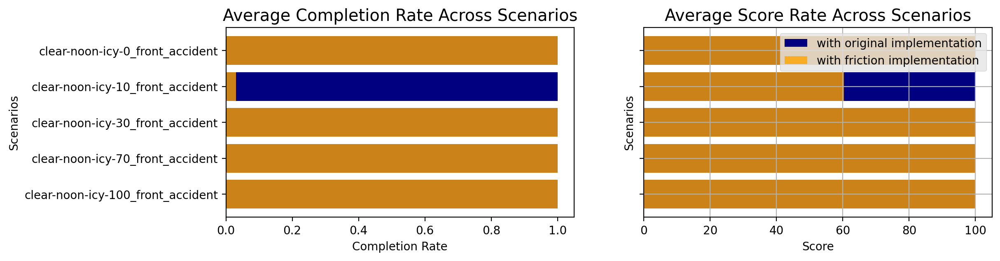

In [32]:
friction_legend = ["with original implementation", "with friction implementation"]

plt.subplots(1, 2, sharey=True, figsize=(12,3), dpi=200)
plt.gca().invert_yaxis()
width = 0.25

plt.subplot(1, 2, 1)
plt.style.use('ggplot')
plt.barh(subfolders, avg_complete_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_complete_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Completion Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Completion Rate')


plt.subplot(1, 2, 2)
plt.style.use('ggplot')
plt.barh(subfolders, avg_score_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_score_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Score Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Score')

plt.grid()

plt.legend()
plt.show()

## Comparison

In [33]:
attribute_order = ["x", "y", "v", "cvip", "steer", "brake", "throttle"]

all_medians = np.empty((len(txt_lists_fric), len(attribute_order), 2), dtype=object)
# [[[], []] * len(attribute_order)  for i in range(len(txt_lists_fric))]

all_medians

array([[[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]]], dtype=object)

In [34]:
full_legend = subfolders.copy()

### x,y traces

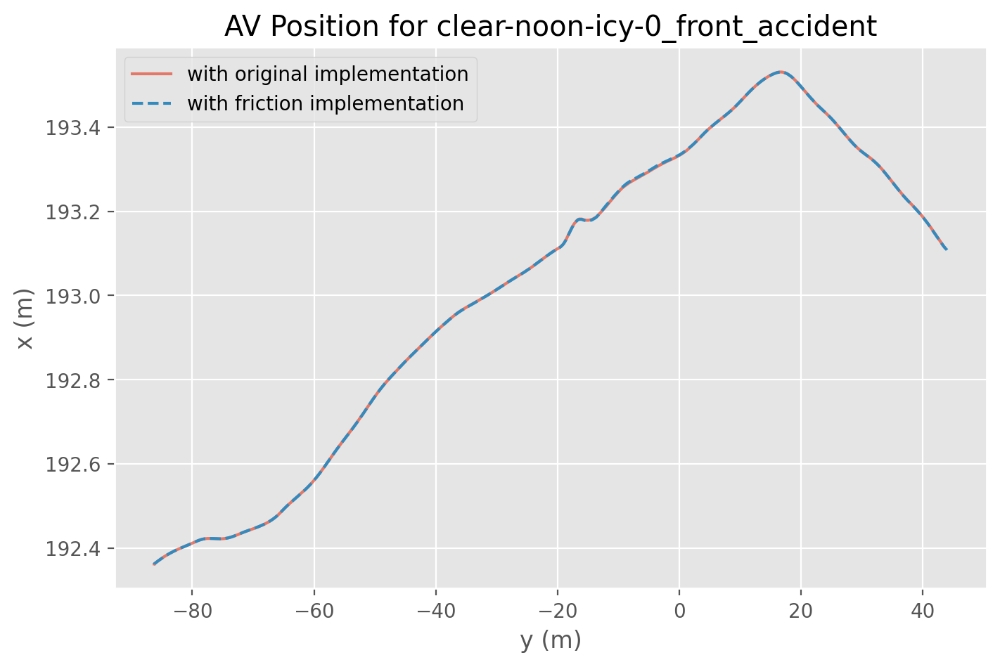

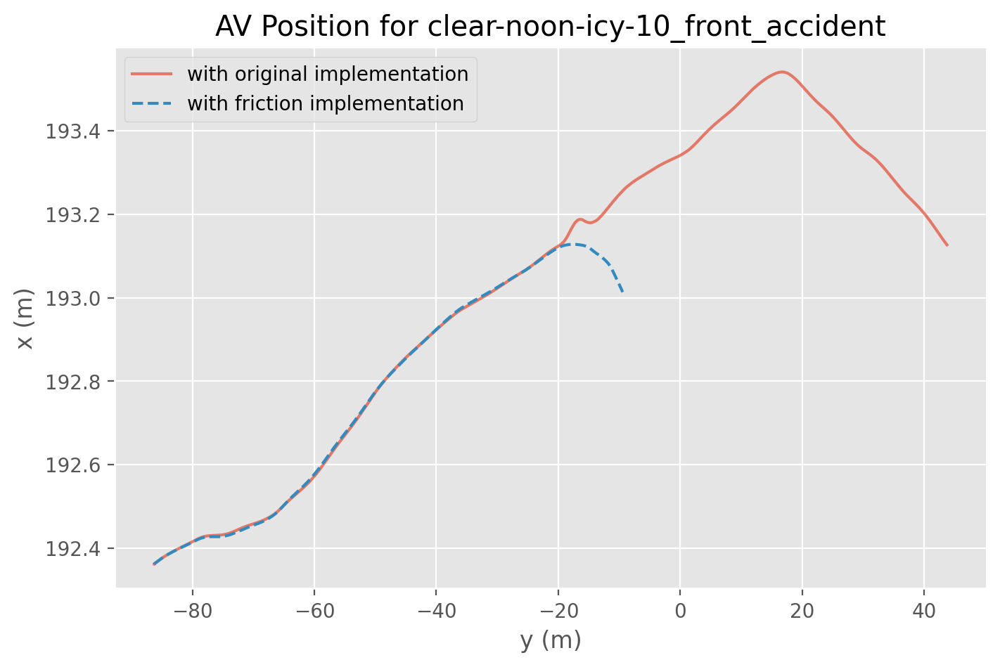

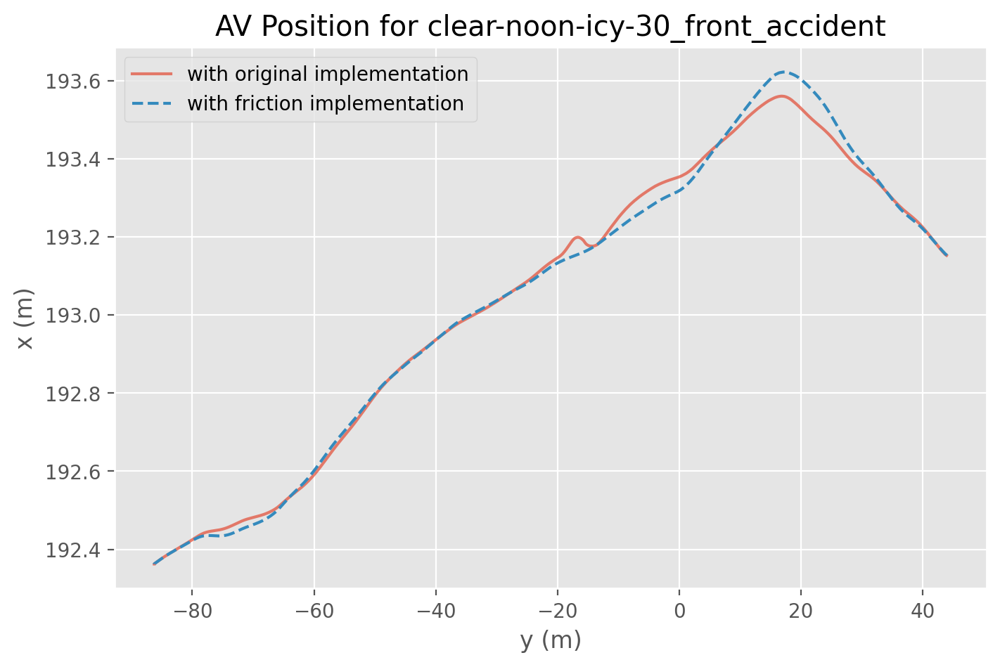

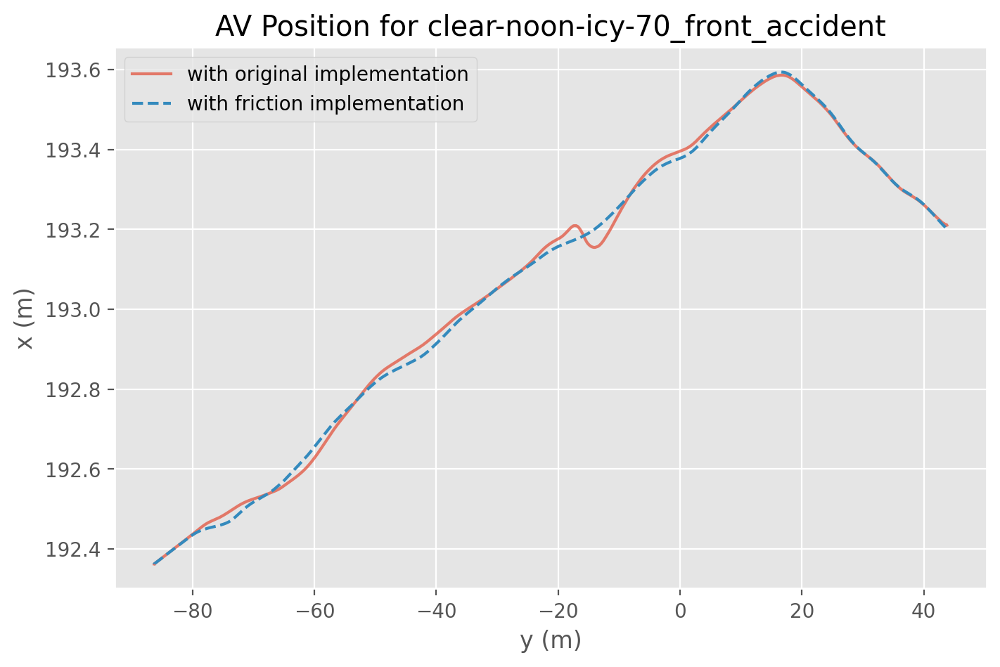

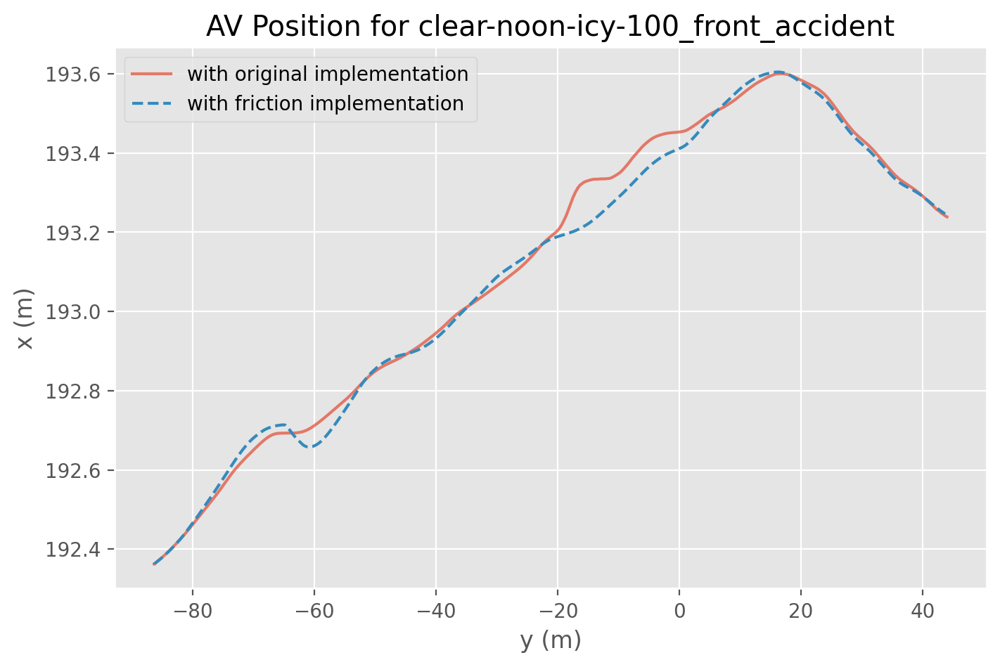

In [35]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)


    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    
    all_medians[weather][0][0] = median_orig_x
    all_medians[weather][0][1] = median_fric_x
    all_medians[weather][1][0] = median_orig_y
    all_medians[weather][1][1] = median_fric_y
    
    plt.plot(median_fric_y, median_fric_x, '--')
    plt.xlabel("y (m)")
    plt.ylabel("x (m)")
    
    plt.title("AV Position for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

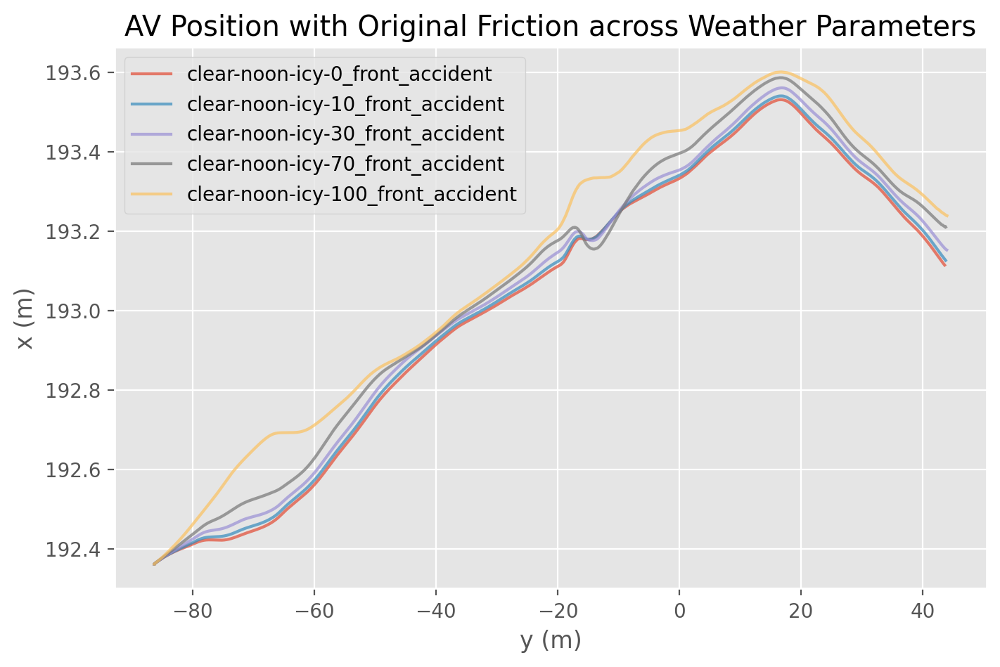

In [36]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)

    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

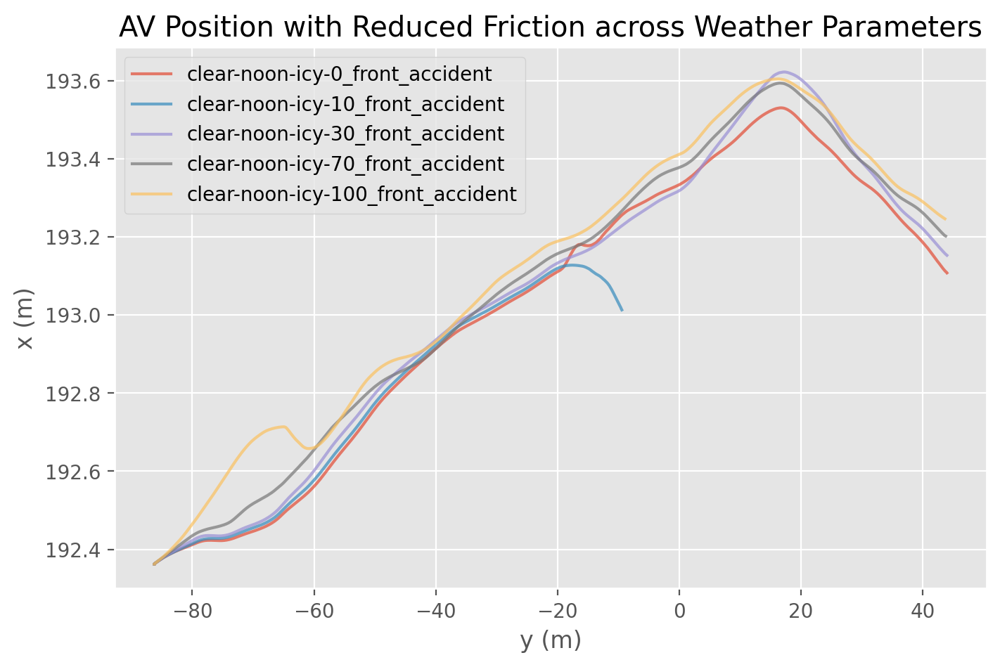

In [37]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    plt.plot(median_fric_y, median_fric_x, alpha=0.7)
    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### v

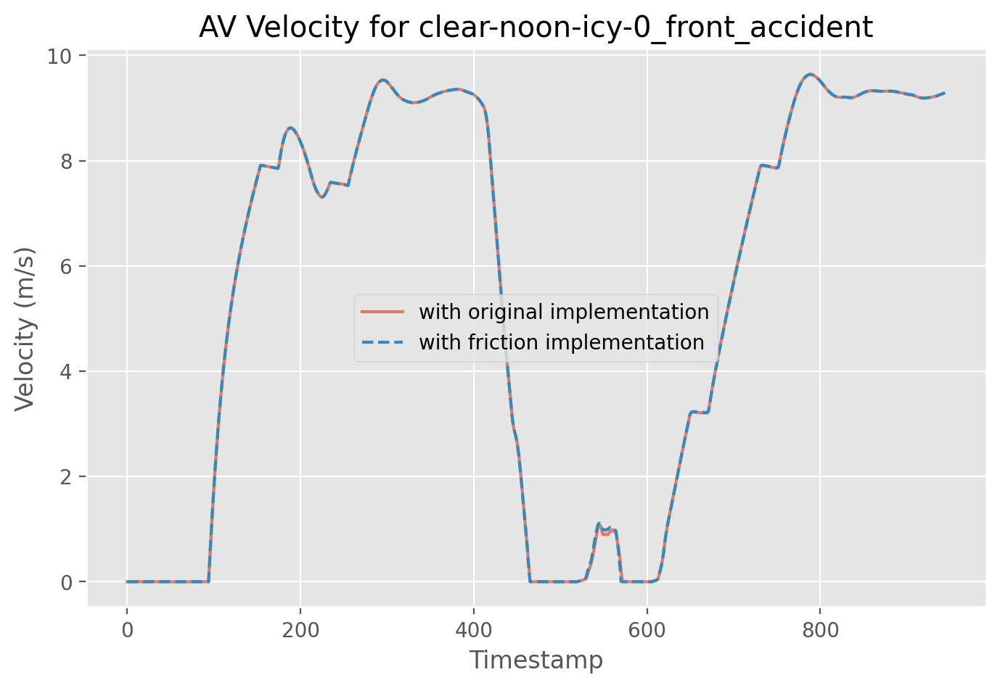

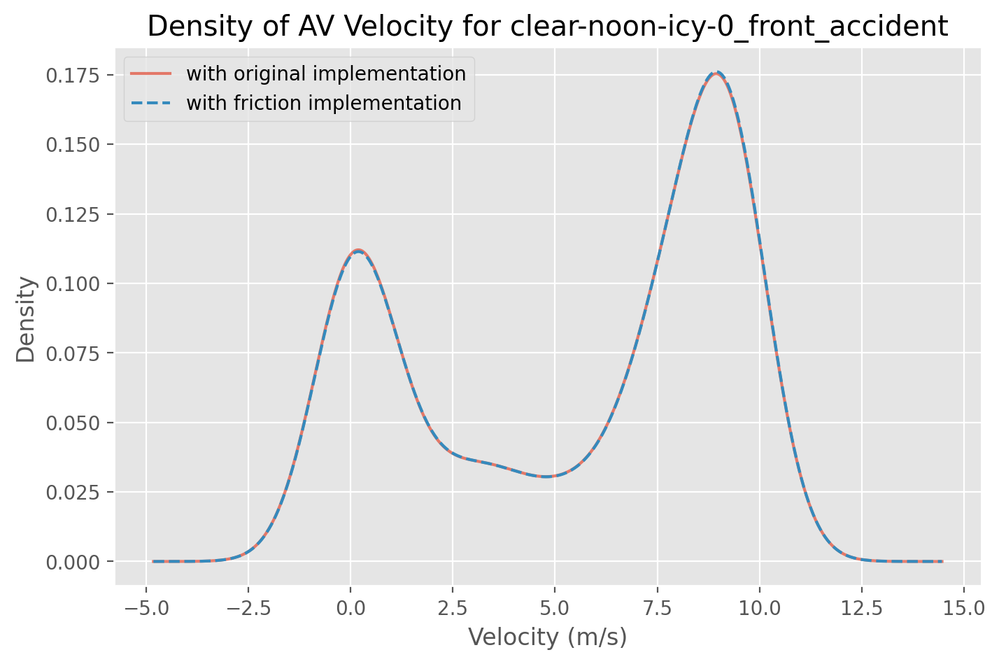

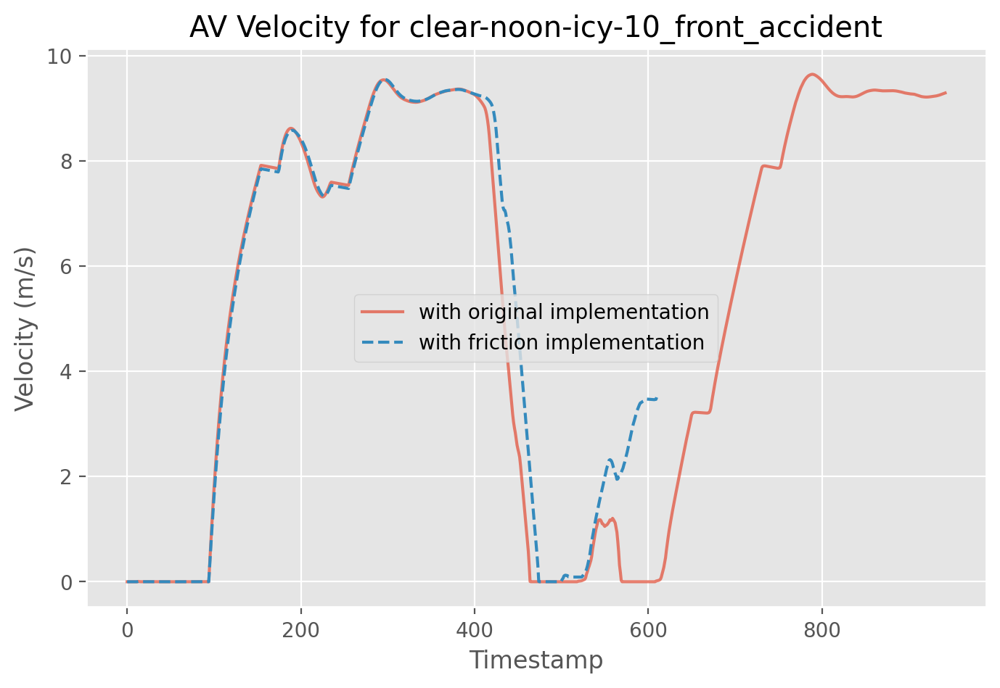

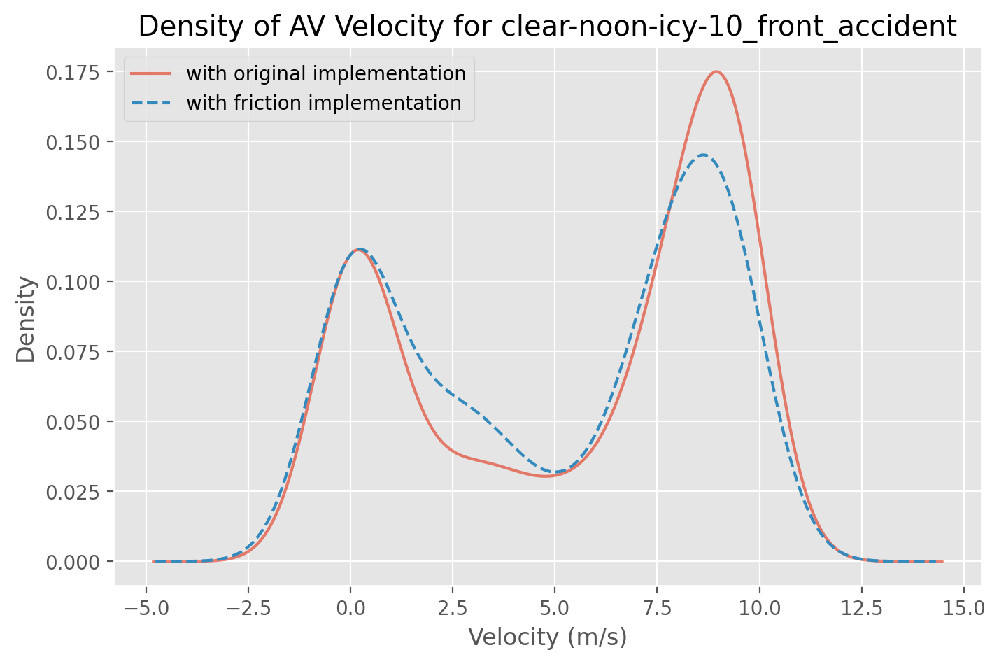

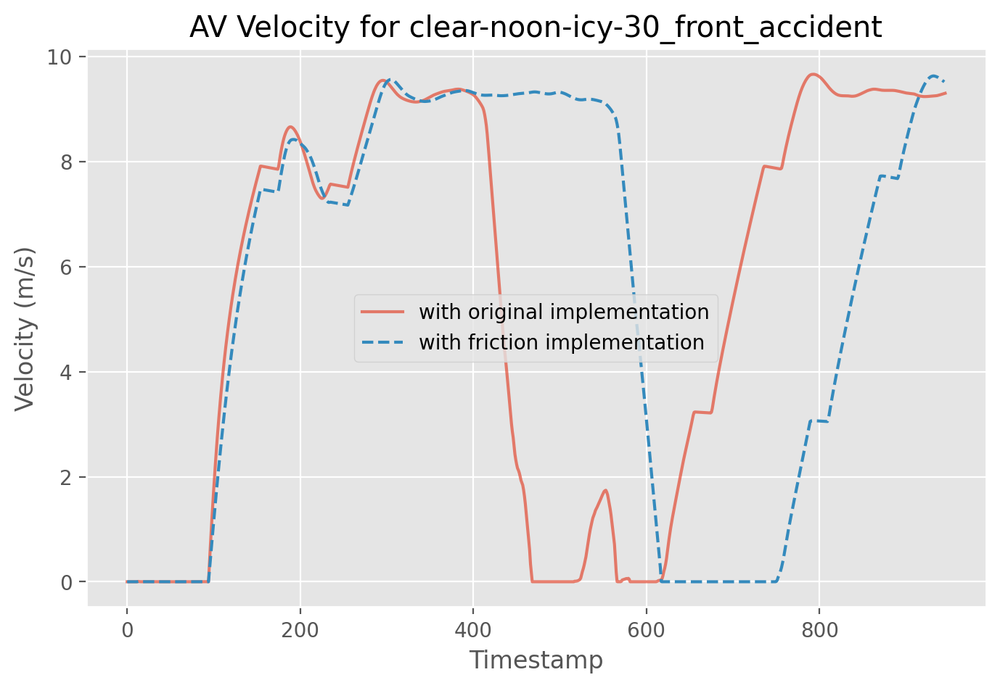

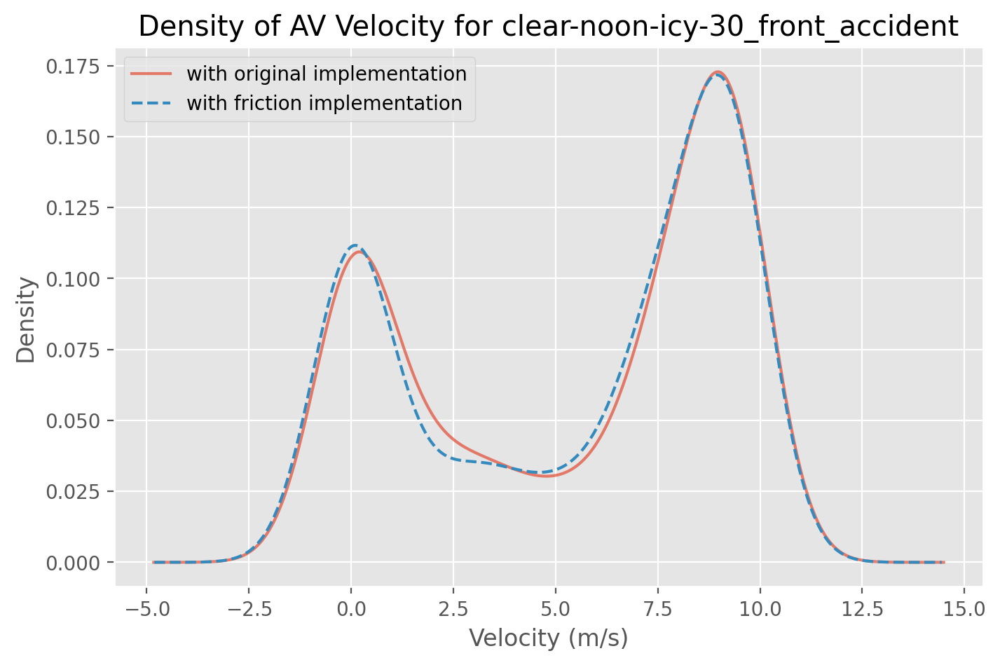

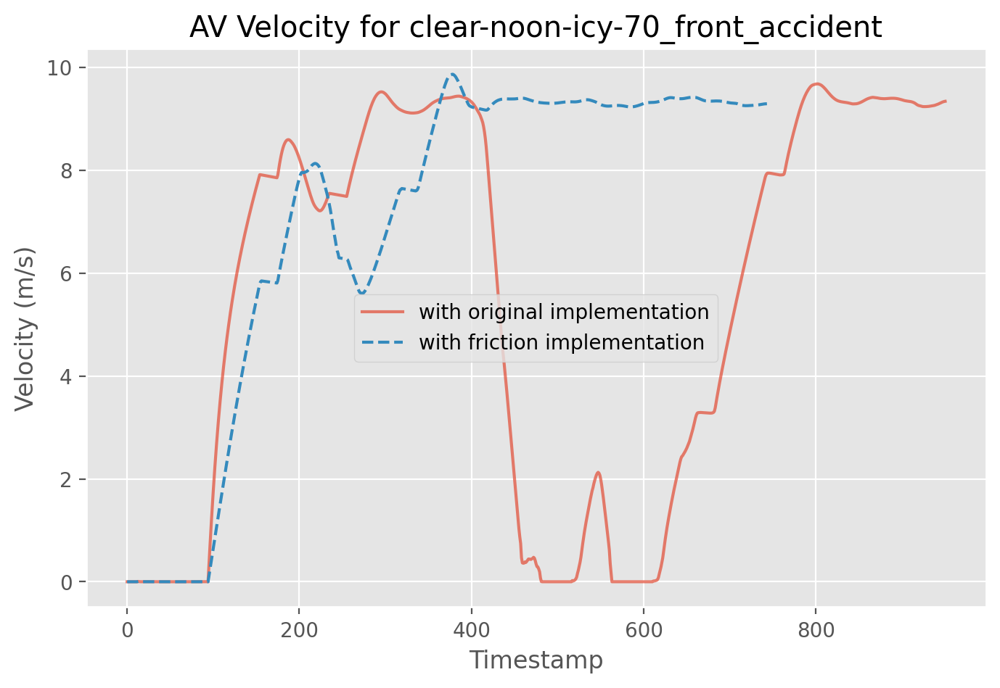

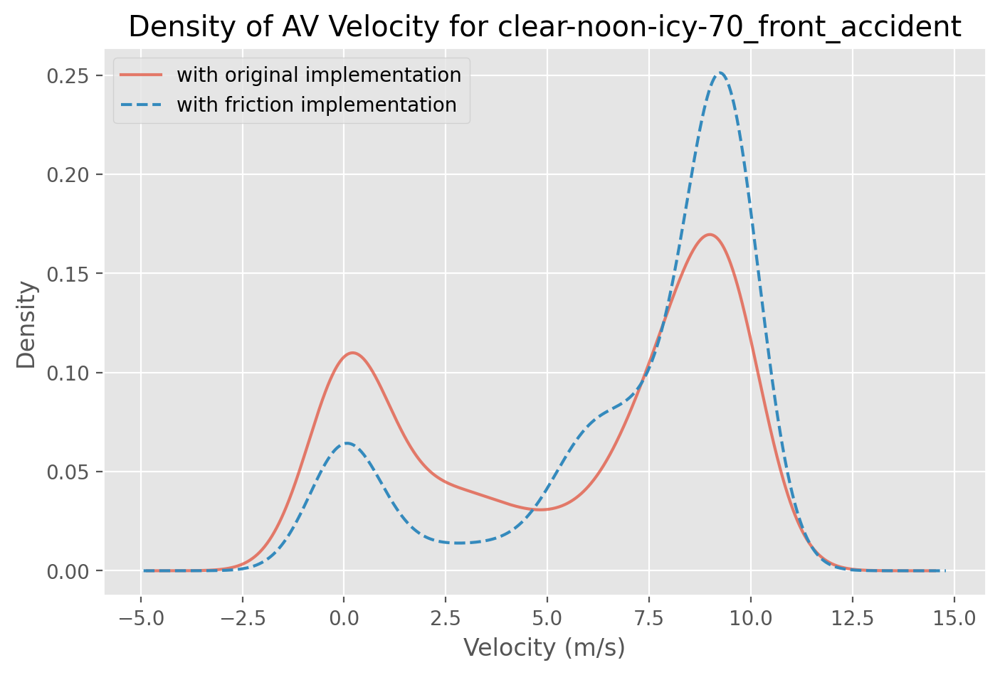

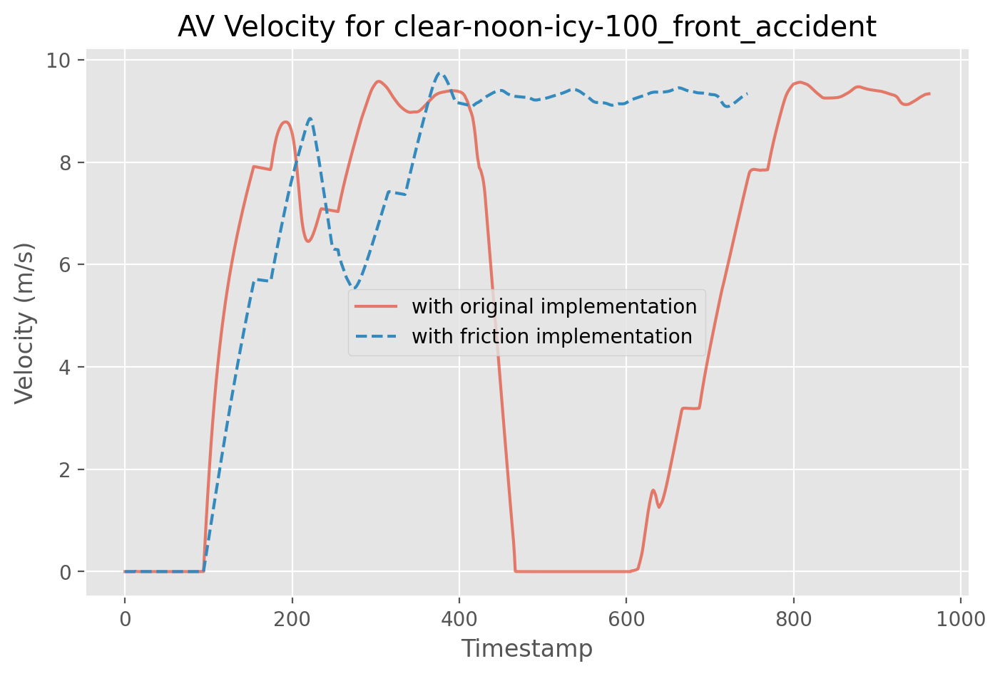

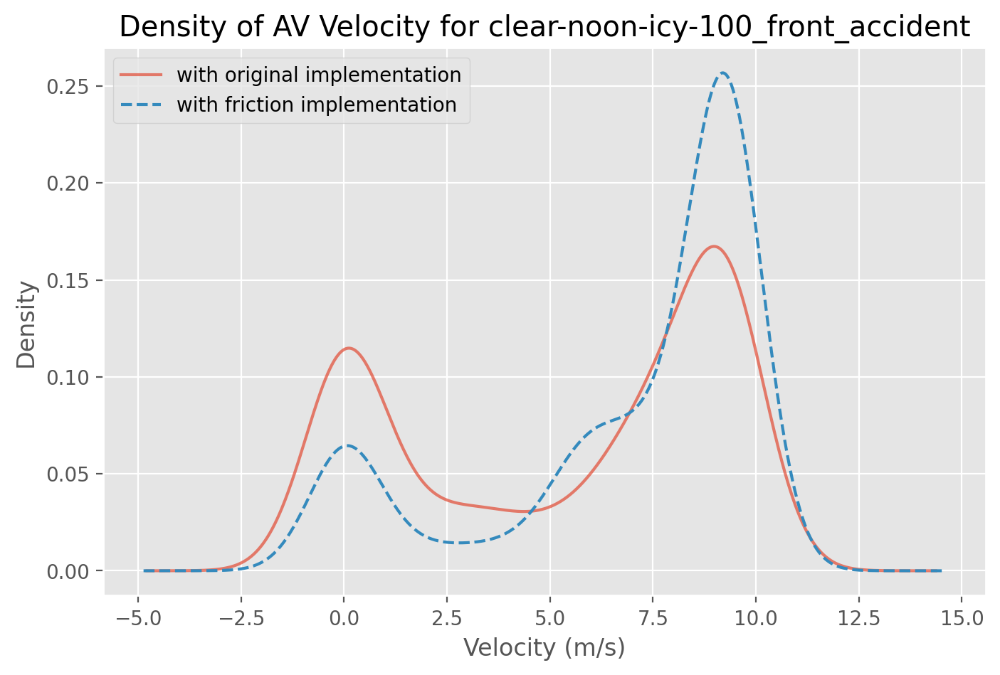

In [38]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)

    plt.plot(median_orig_v, alpha=0.7)


    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any():
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)
    
    all_medians[weather][2][0] = median_orig_v
    all_medians[weather][2][1] = median_fric_v
    
    plt.plot(median_fric_v, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Velocity (m/s)")
    plt.title("AV Velocity for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Velocity (m/s)")
    plt.ylabel("Density")
    median_orig_v.plot.density(alpha=0.7)
    median_fric_v.plot.density(style='--')
    plt.title("Density of AV Velocity for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

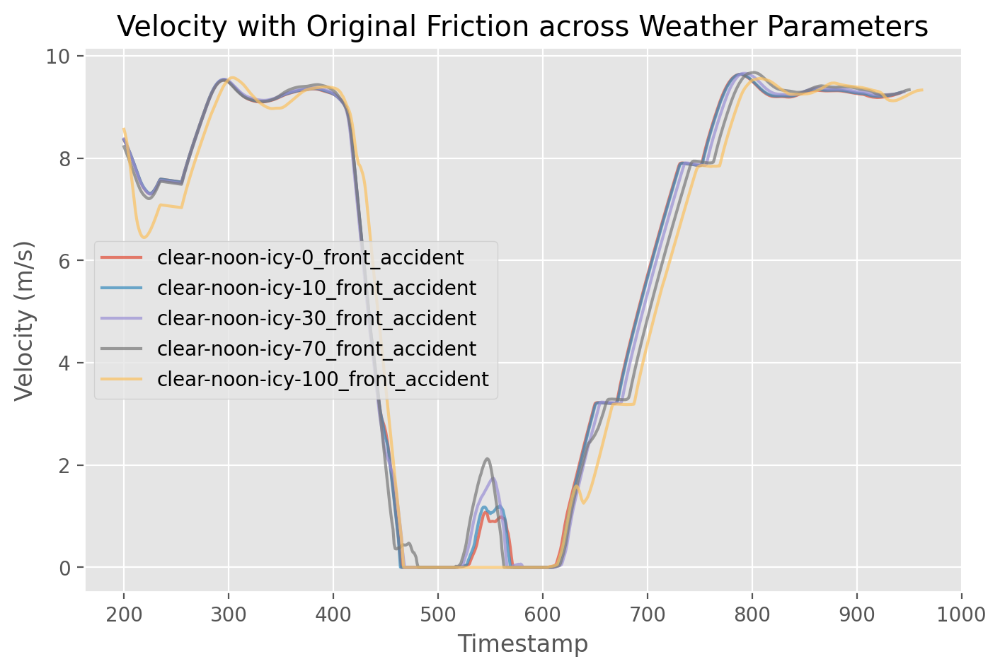

In [39]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'v'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)


    plt.plot(median_orig_v[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

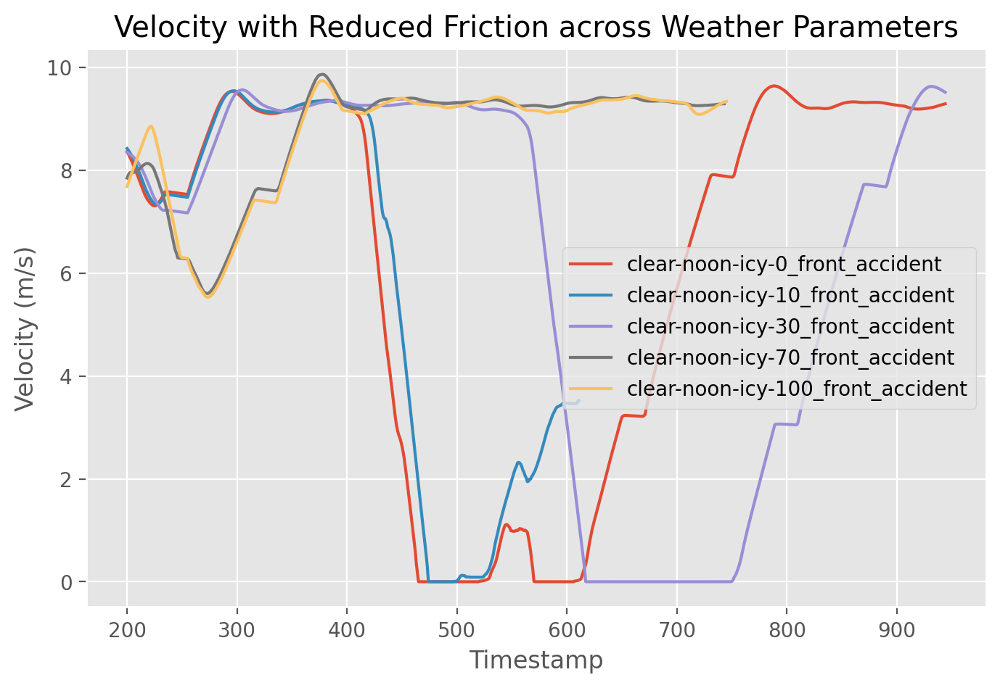

In [40]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any() :
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)

    plt.plot(median_fric_v[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### cvip

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
940     36.958373
941     36.991209
942     37.025114
943     37.153297
944     37.377491
Length: 945, dtype: float64


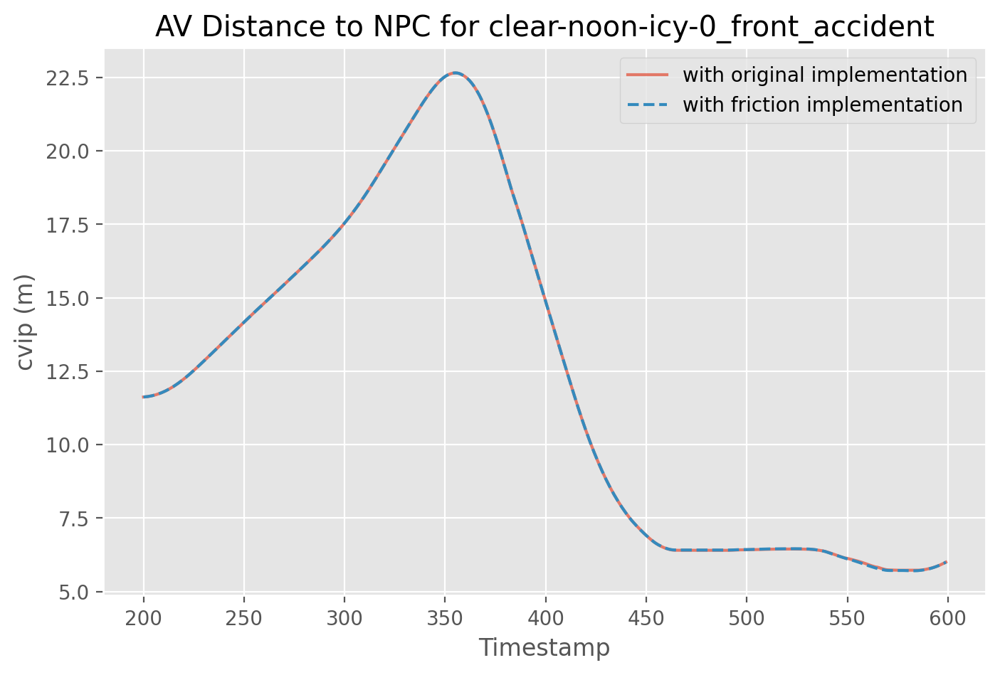

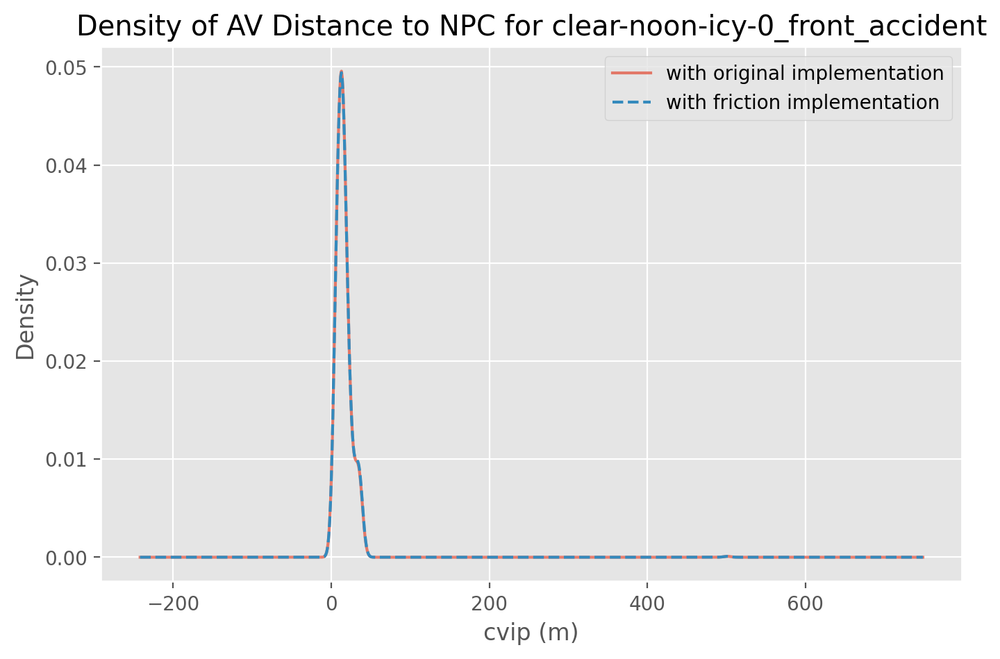

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
607      2.981913
608      2.942639
609      2.910829
610      2.890354
611      2.885659
Length: 612, dtype: float64


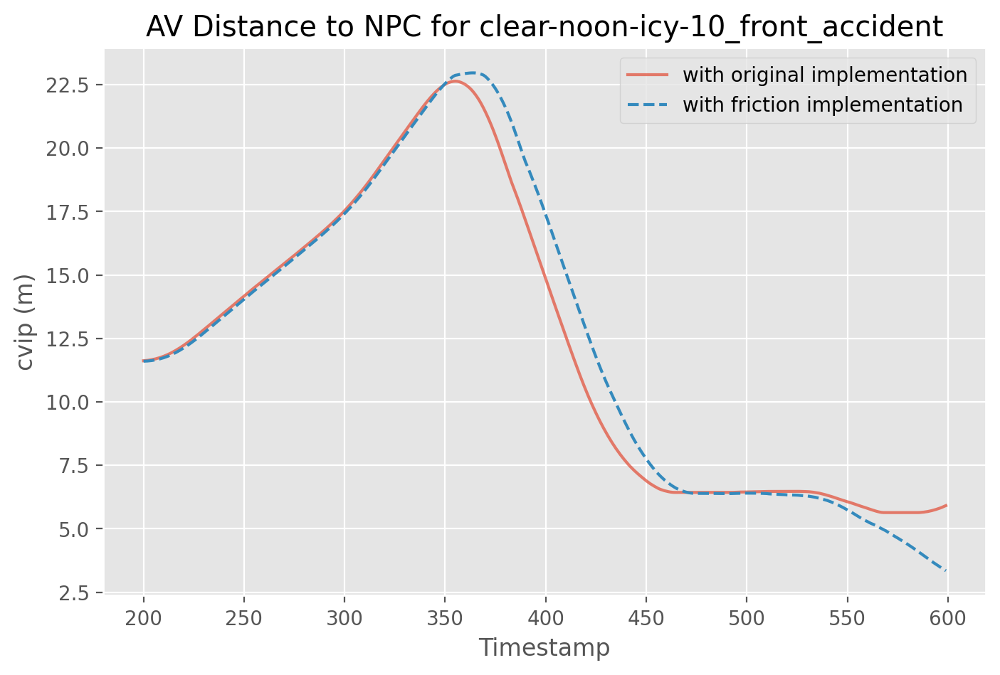

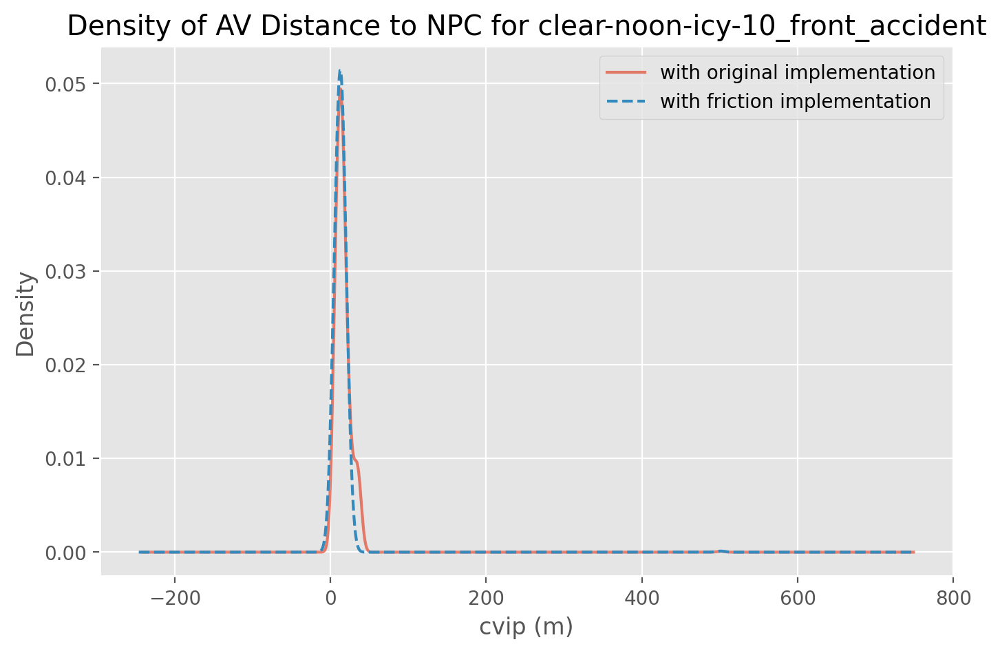

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
940     27.260551
941     27.382500
942     27.506161
943     27.630466
944     27.759218
Length: 945, dtype: float64


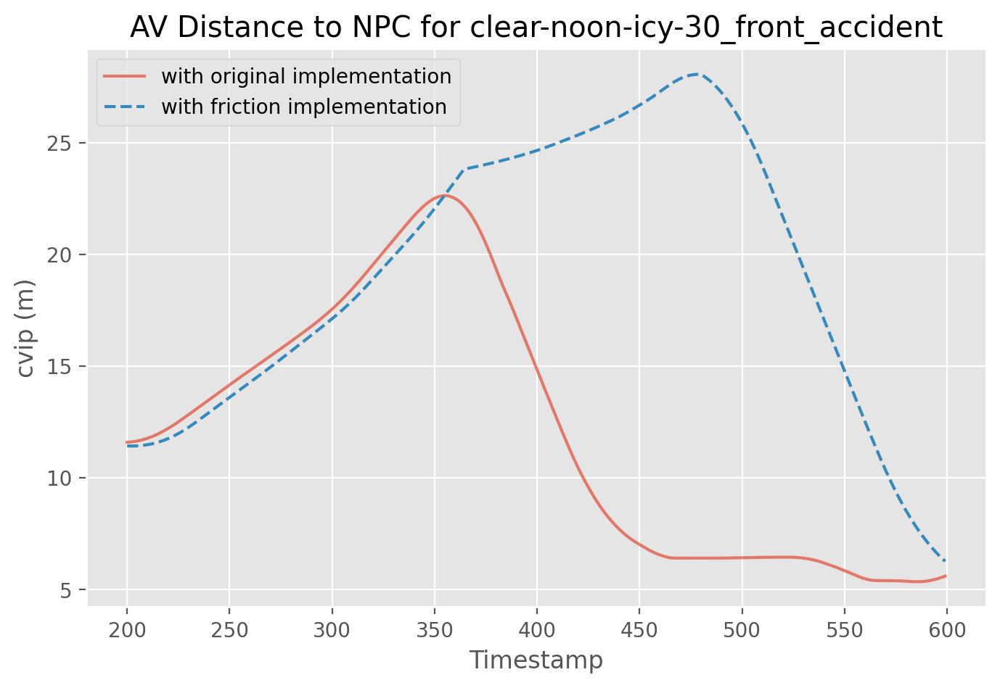

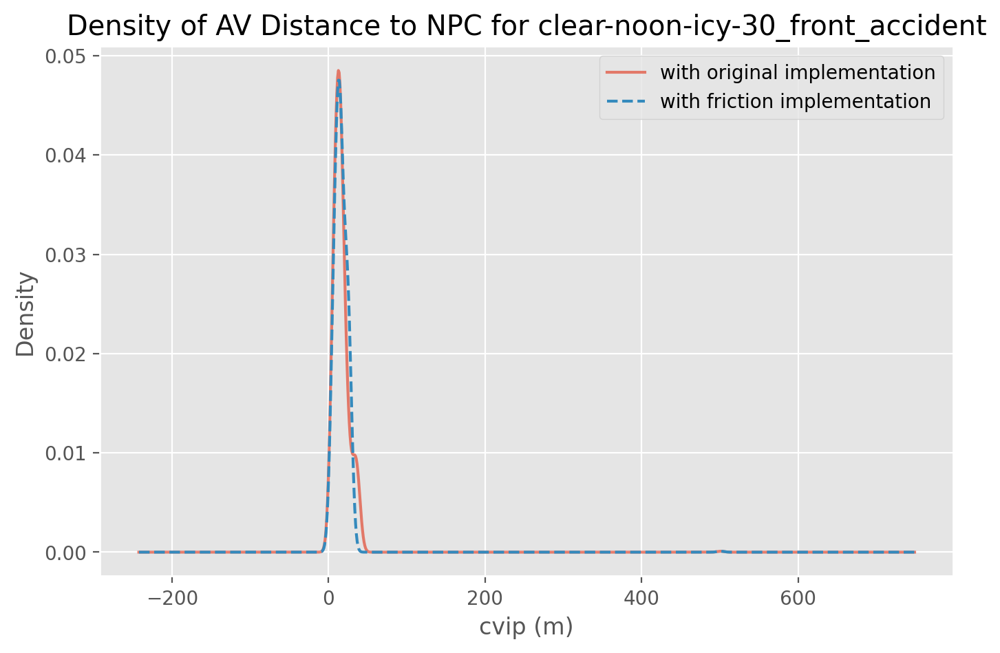

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
739     16.680583
740     16.391991
741     16.116368
742     15.854214
743     15.602248
Length: 744, dtype: float64


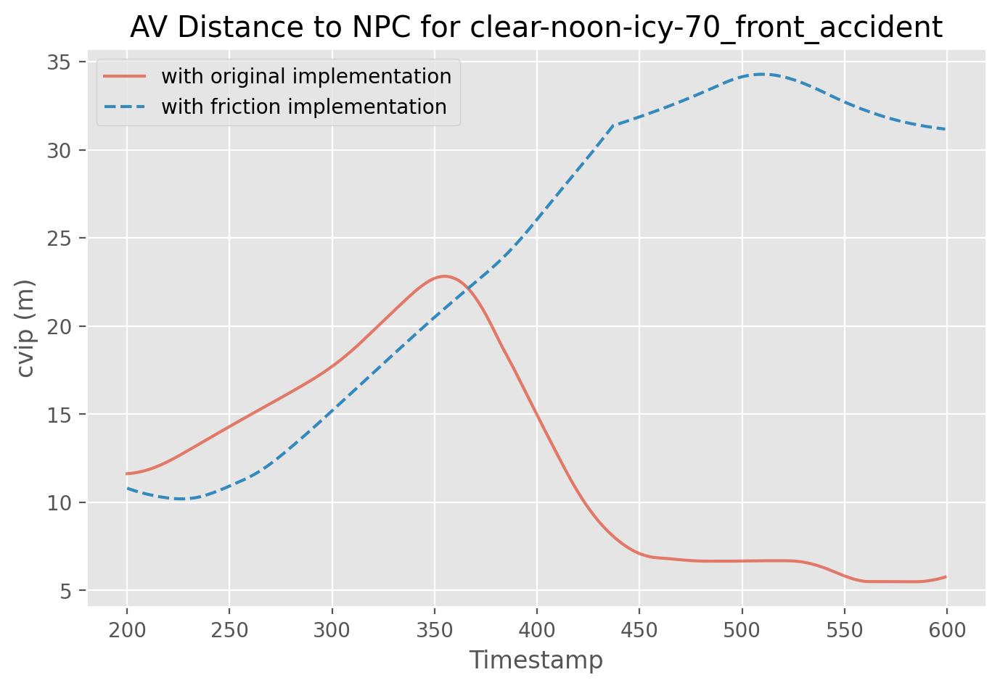

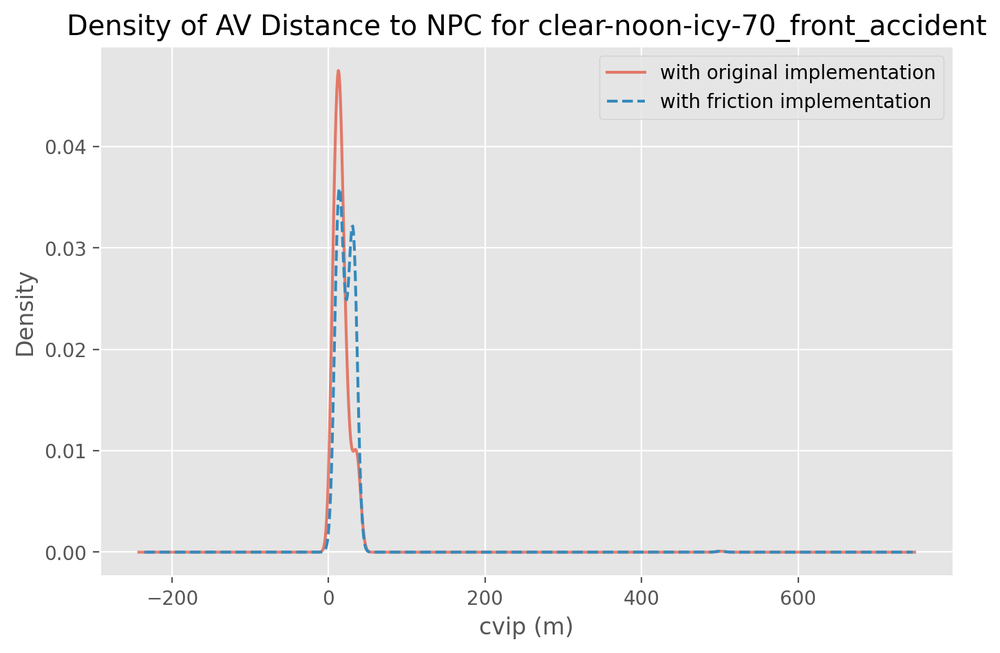

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
741     31.873936
742     31.745191
743     31.614662
744     31.482336
745     31.348156
Length: 746, dtype: float64


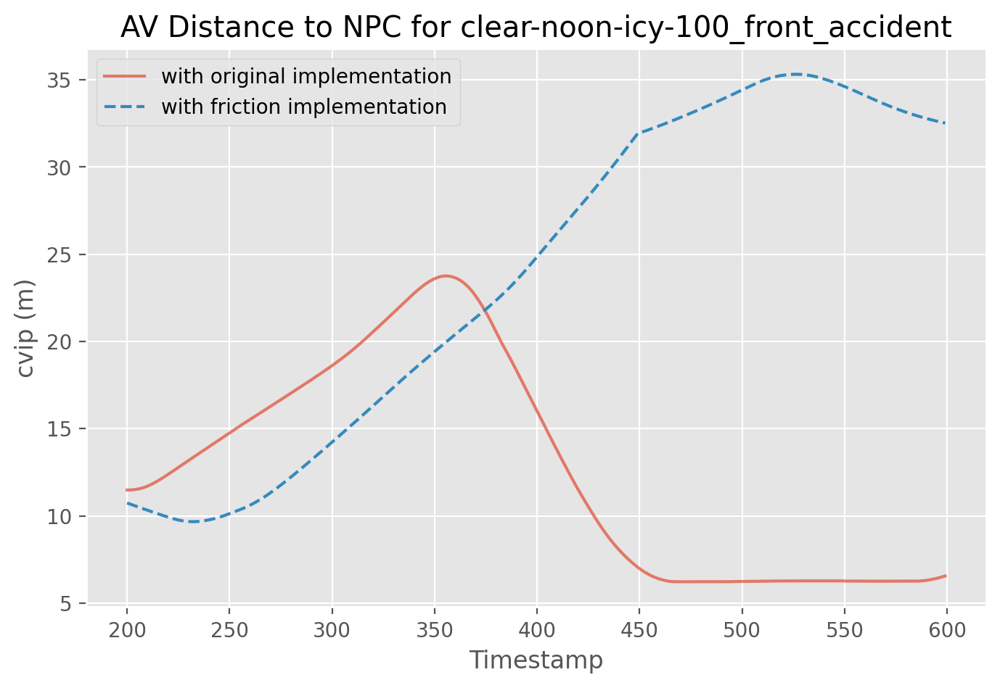

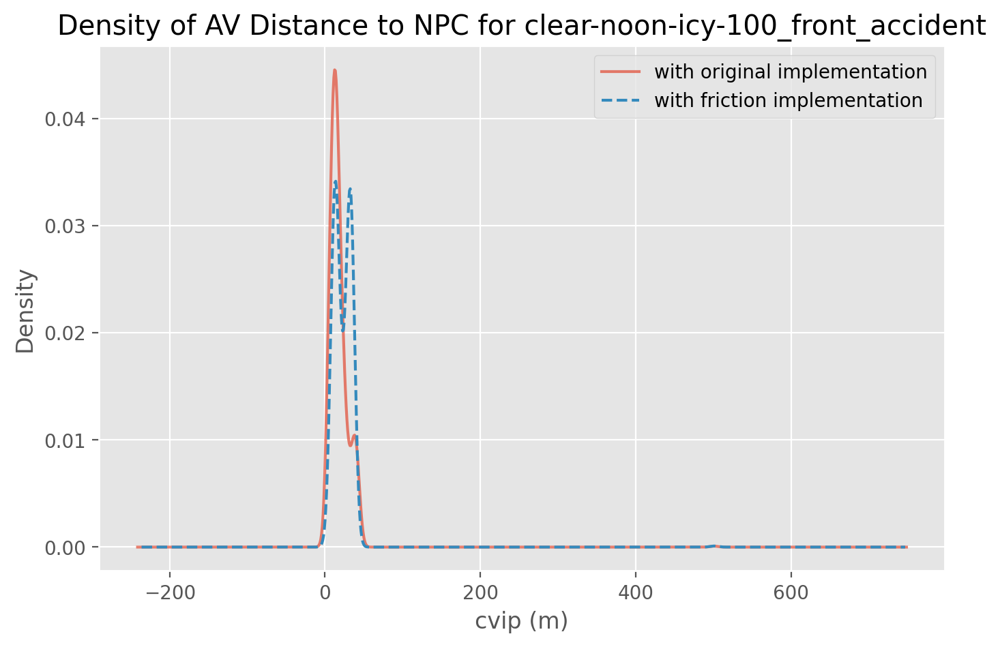

In [41]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)

    plt.plot(median_orig_cvip.iloc[200:600], alpha=0.7)


    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any():
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)
    
    print(median_fric_cvip)
    
    all_medians[weather][3][0] = median_orig_cvip
    all_medians[weather][3][1] = median_fric_cvip
    
    plt.plot(median_fric_cvip.iloc[200:600], '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("cvip (m)")
    plt.title("AV Distance to NPC for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("cvip (m)")
    plt.ylabel("Density")
    median_orig_cvip.plot.density(alpha=0.7)
    median_fric_cvip.plot.density(style='--')
    plt.title("Density of AV Distance to NPC for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

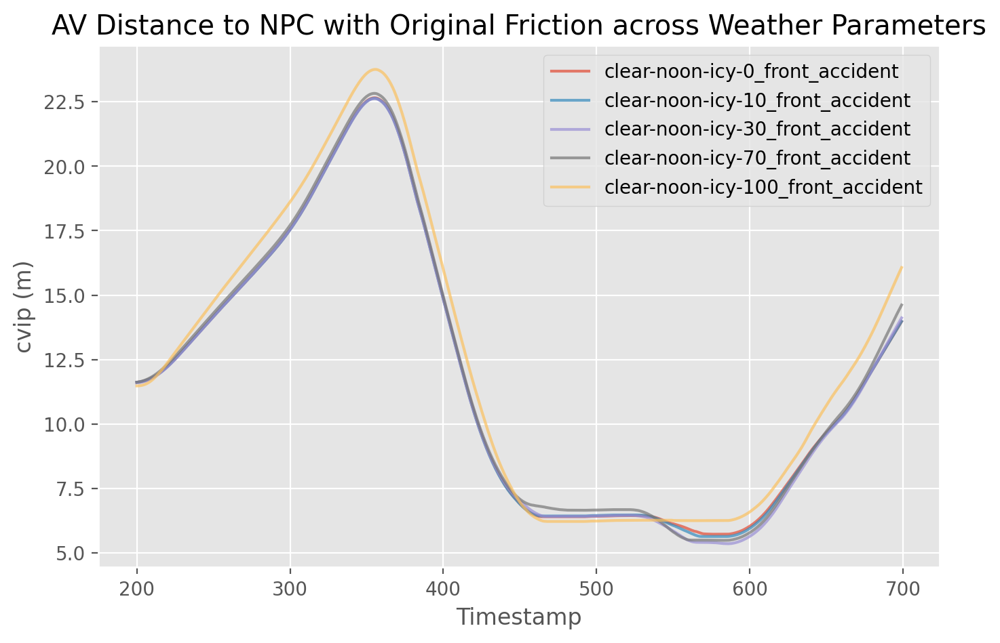

In [42]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)


    plt.plot(median_orig_cvip[200:700], alpha=0.7)



    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

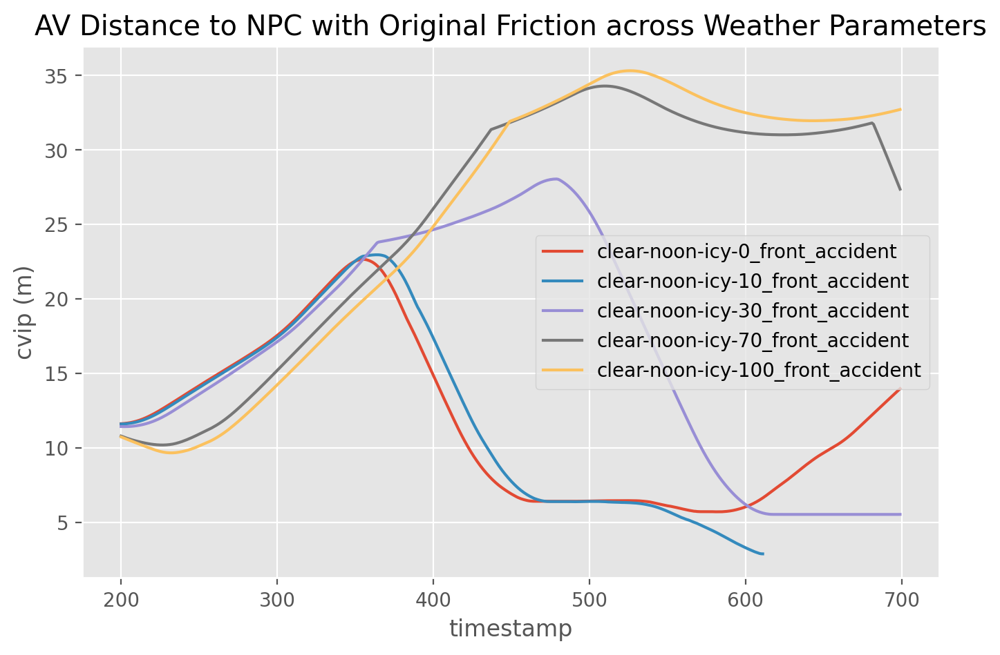

In [43]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any() :
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)

    plt.plot(median_fric_cvip[200:700])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### steer

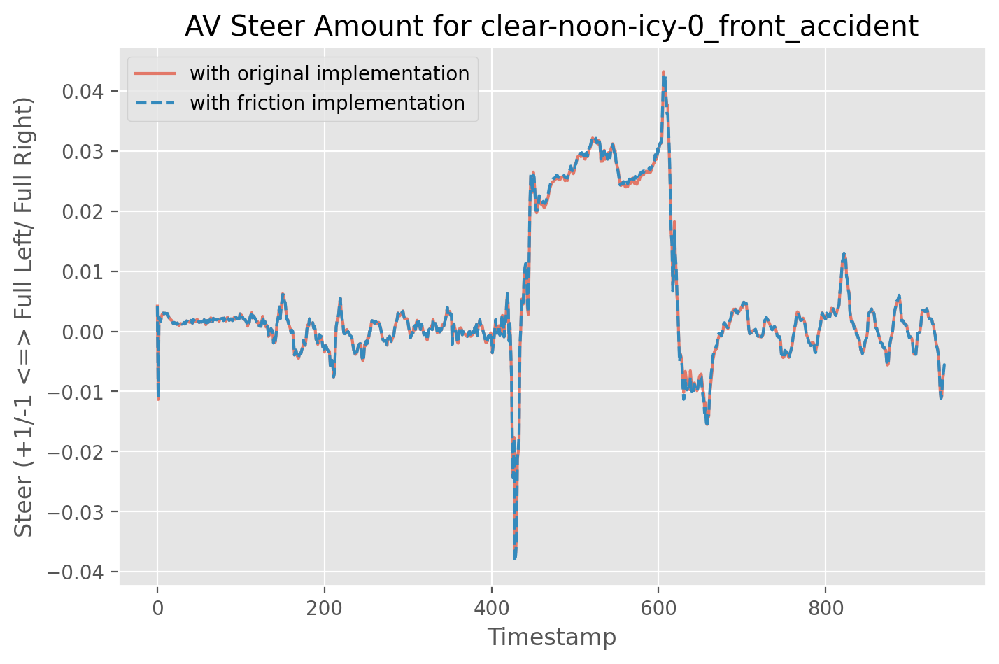

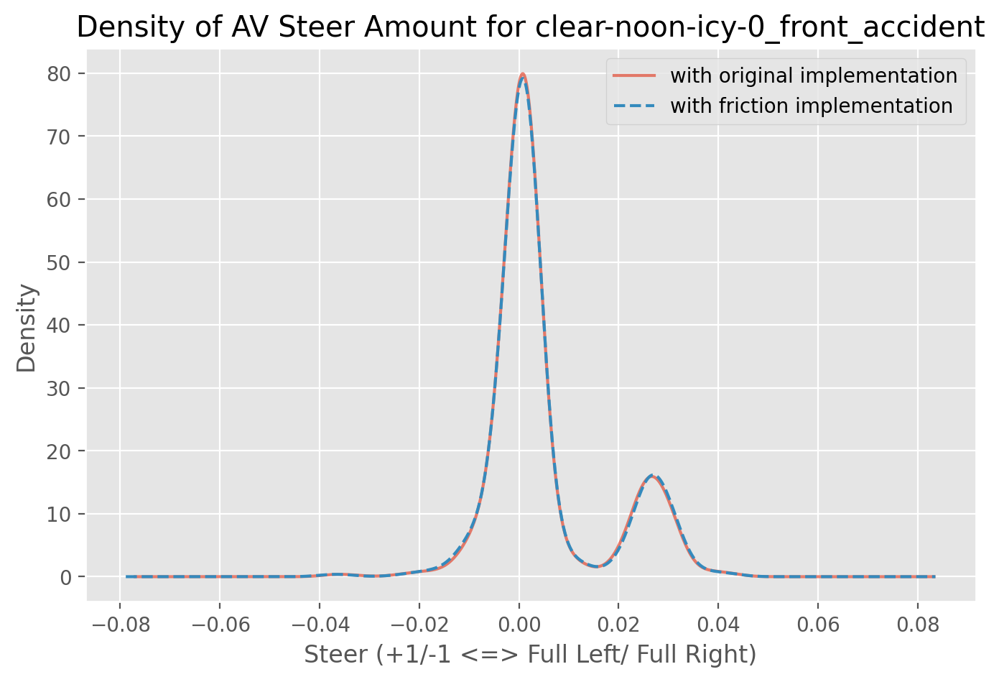

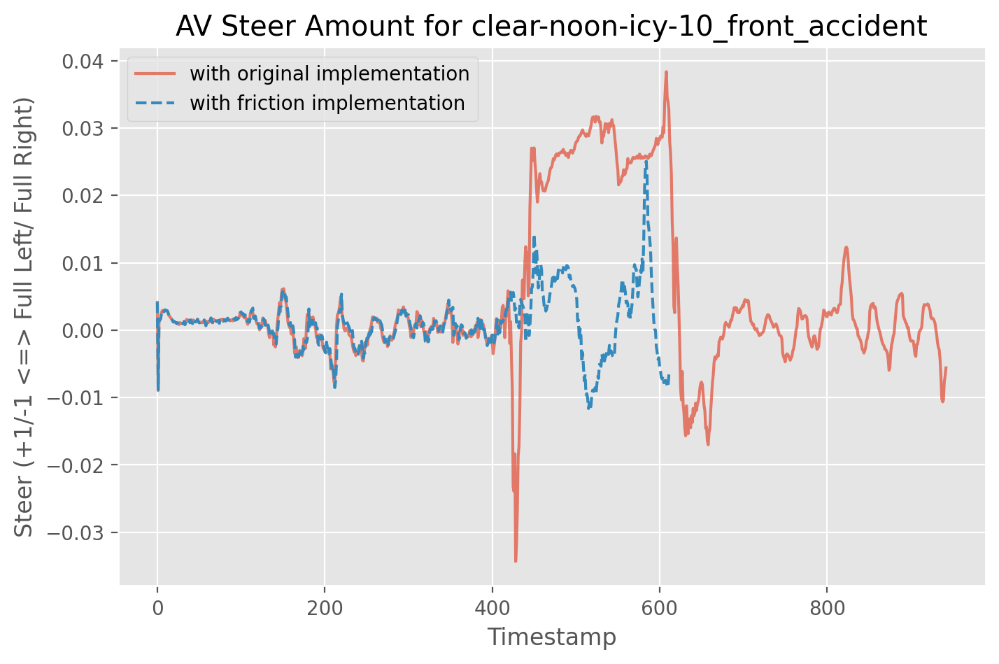

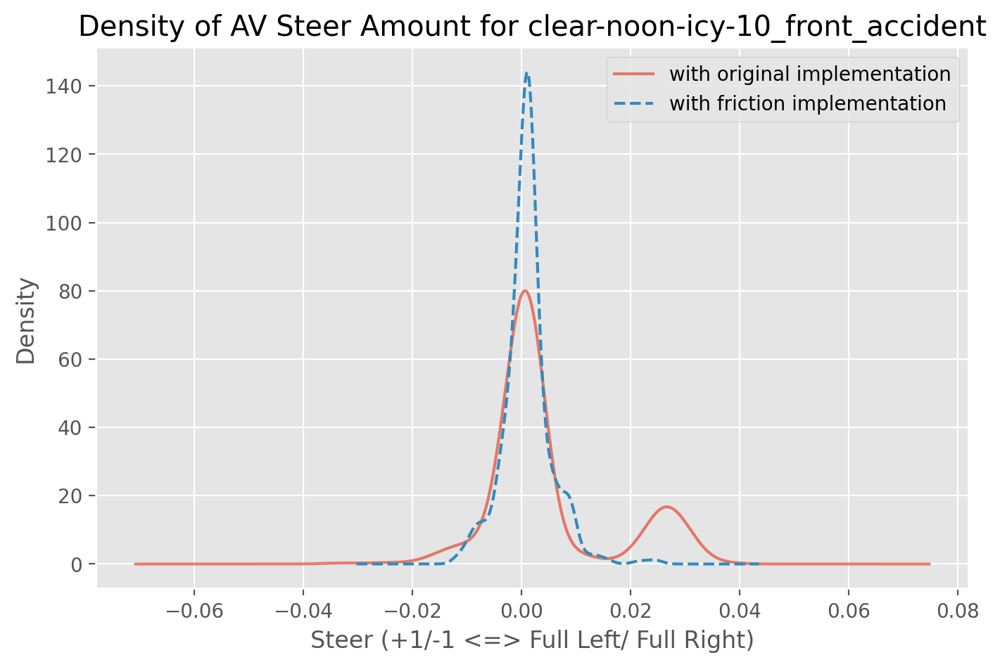

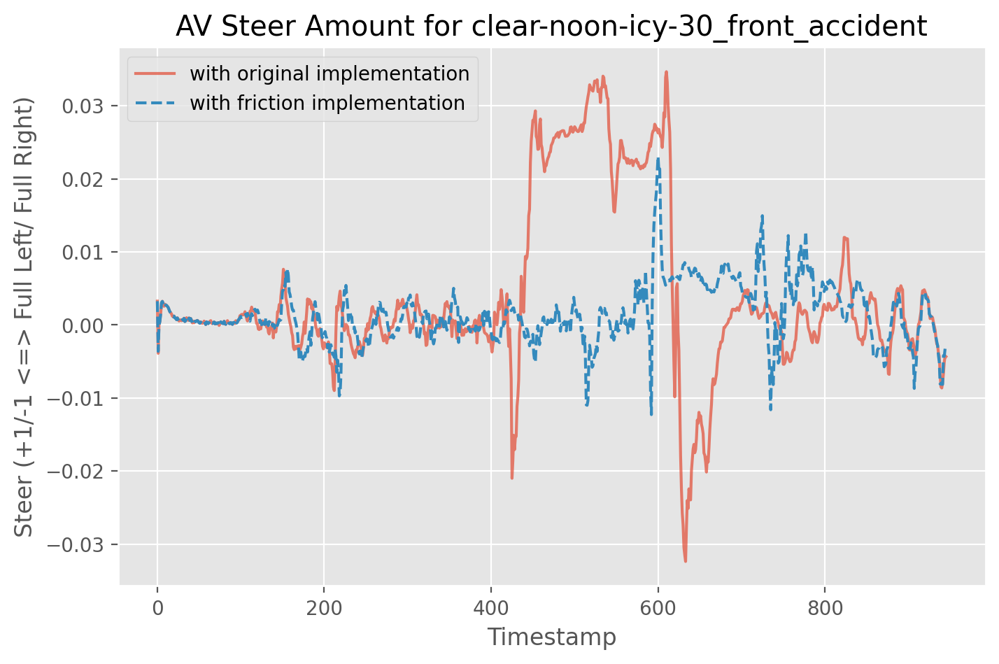

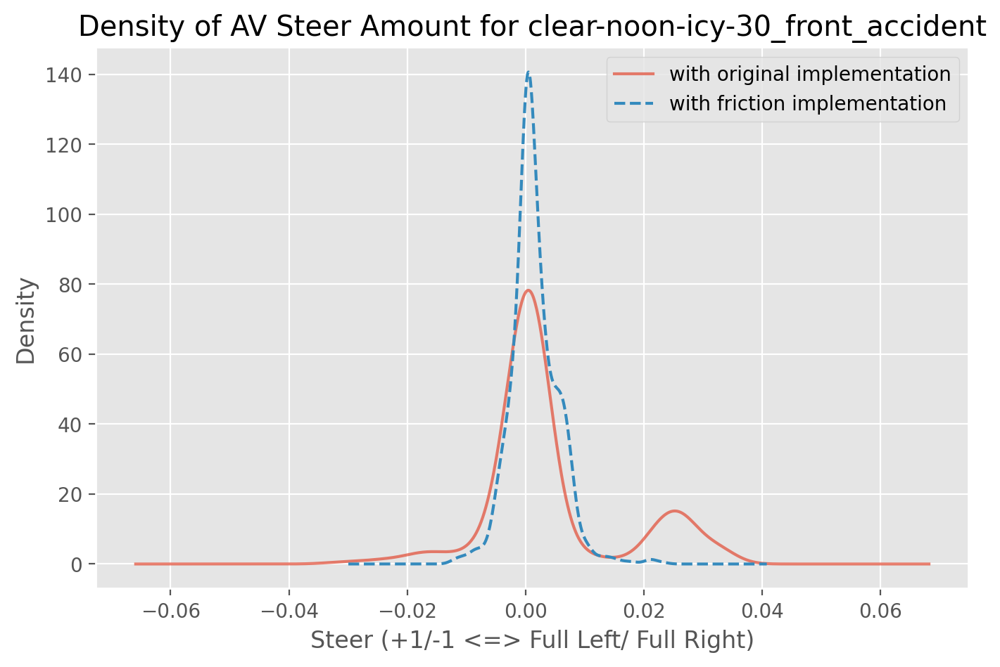

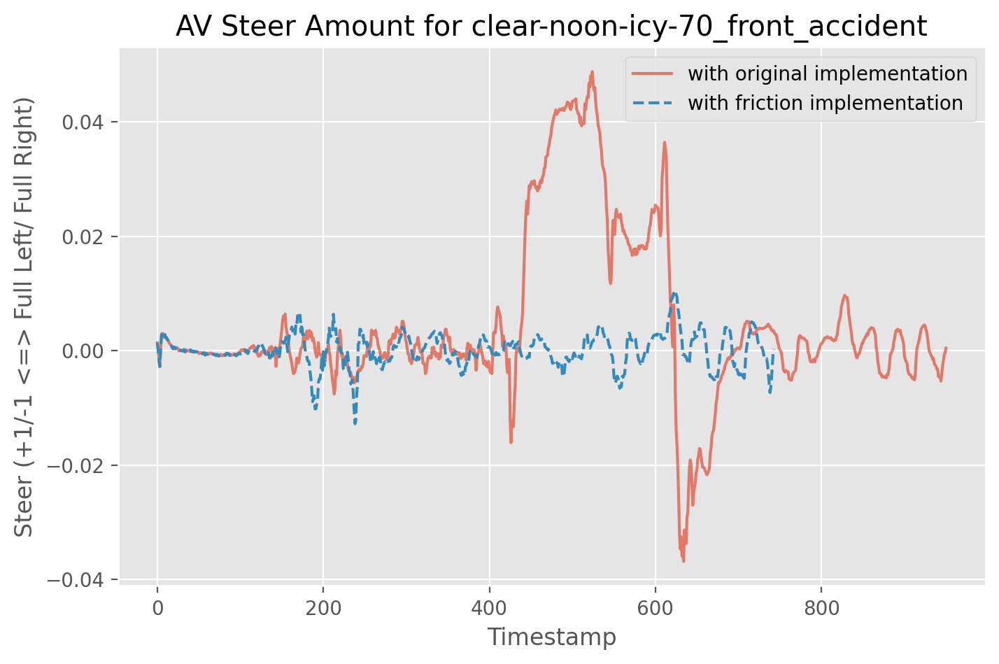

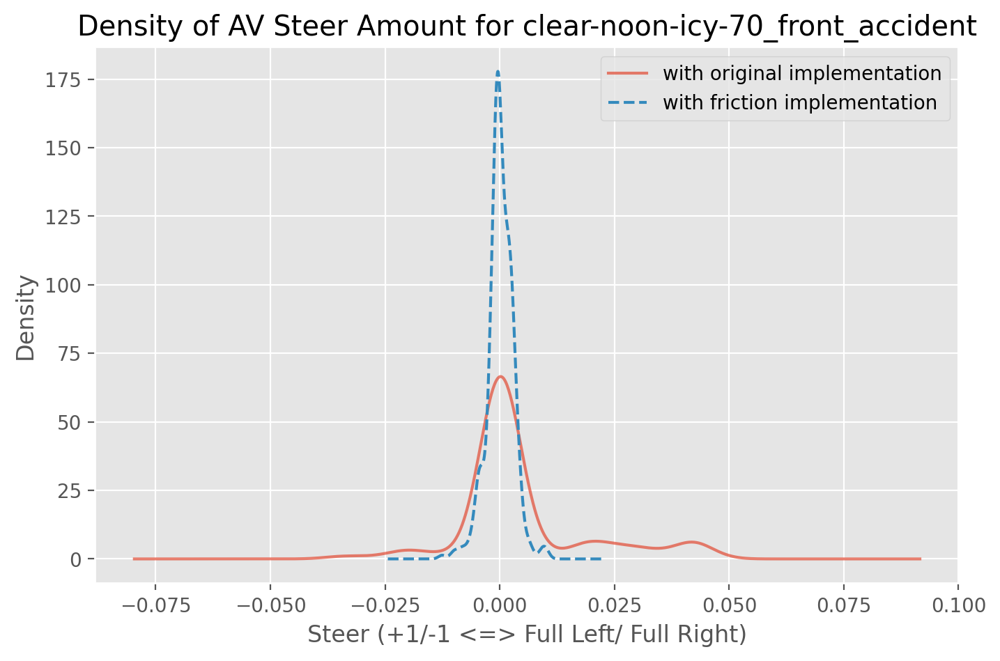

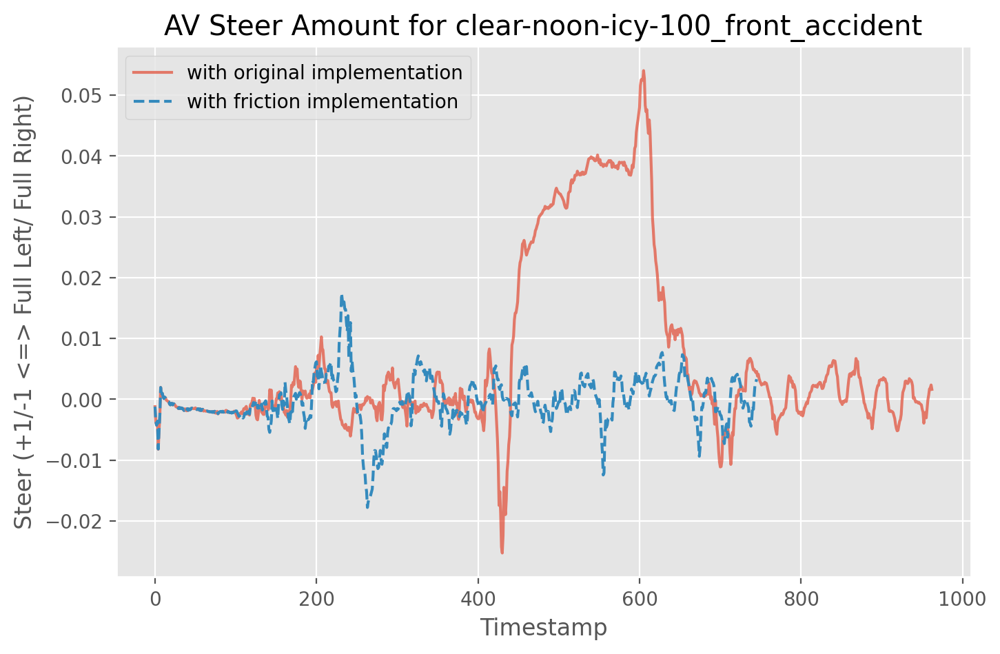

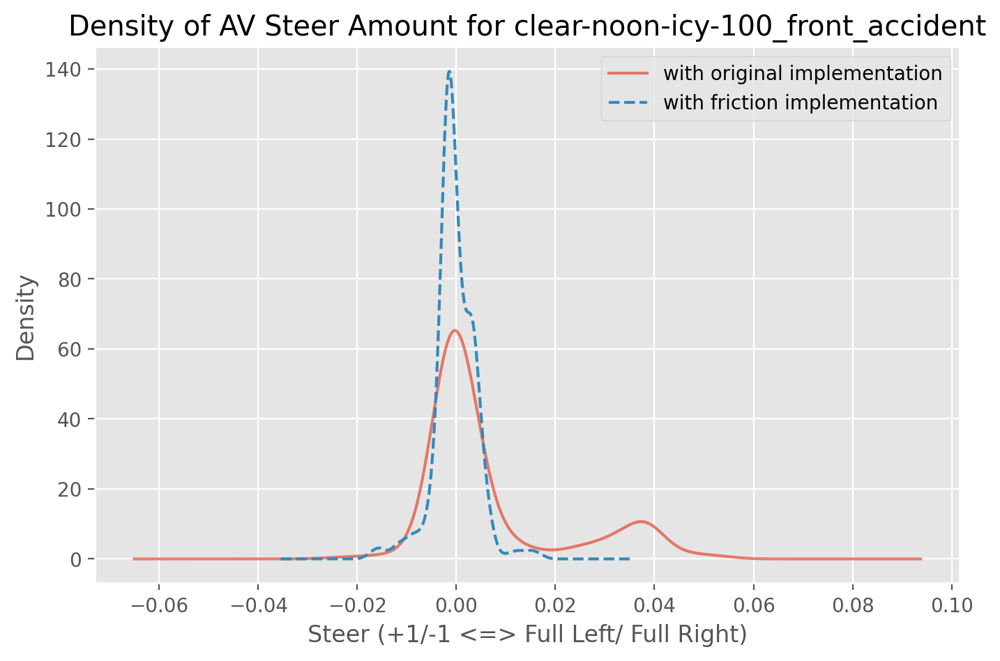

In [44]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)

    plt.plot(median_orig_steer, alpha=0.7)


    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any():
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)
    
    all_medians[weather][4][0] = median_orig_steer
    all_medians[weather][4][1] = median_fric_steer
    
    plt.plot(median_fric_steer, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
    plt.title("AV Steer Amount for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Steer (+1/-1 <=> Full Left/ Full Right)")
    plt.ylabel("Density")
    median_orig_steer.plot.density(alpha=0.7)
    median_fric_steer.plot.density(style='--')
    plt.title("Density of AV Steer Amount for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

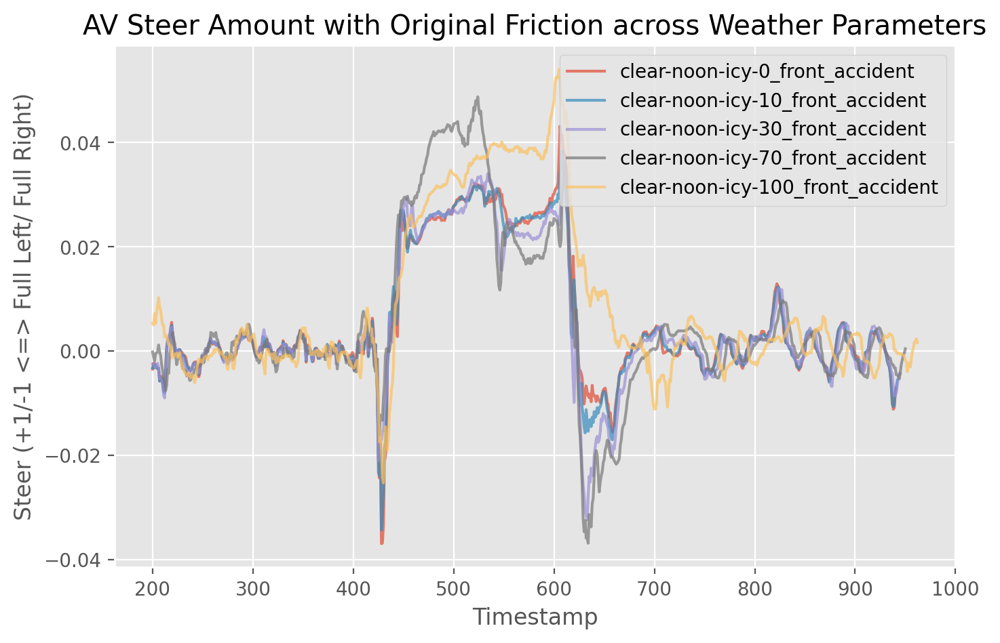

In [45]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'steer'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)


    plt.plot(median_orig_steer[200:], alpha=0.7)

plt.xlabel("Timestamp")
plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
plt.title("AV Steer Amount with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

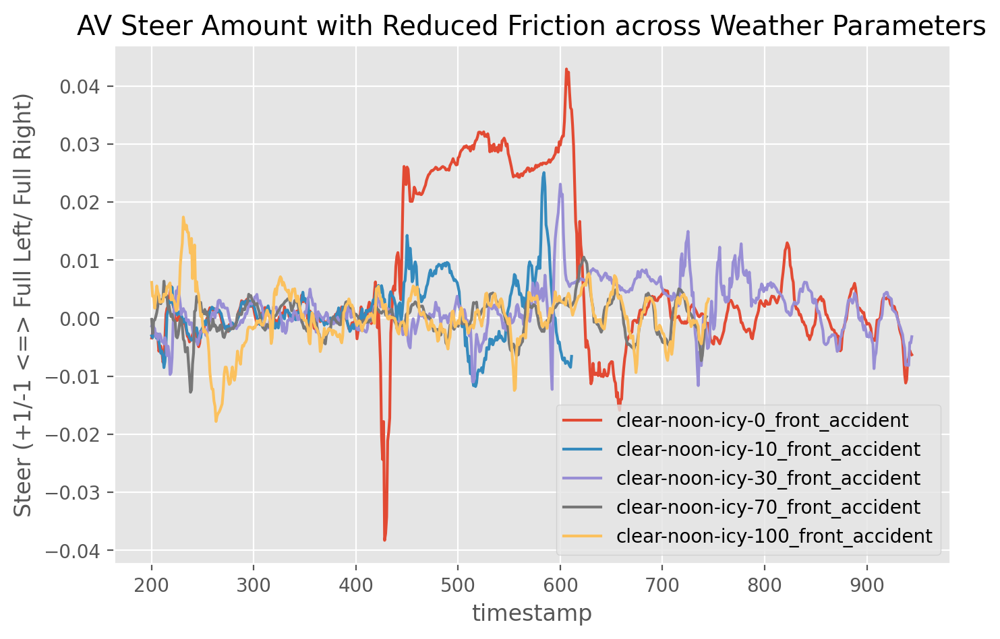

In [46]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any() :
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)

    plt.plot(median_fric_steer[200:])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
plt.title("AV Steer Amount with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### brake

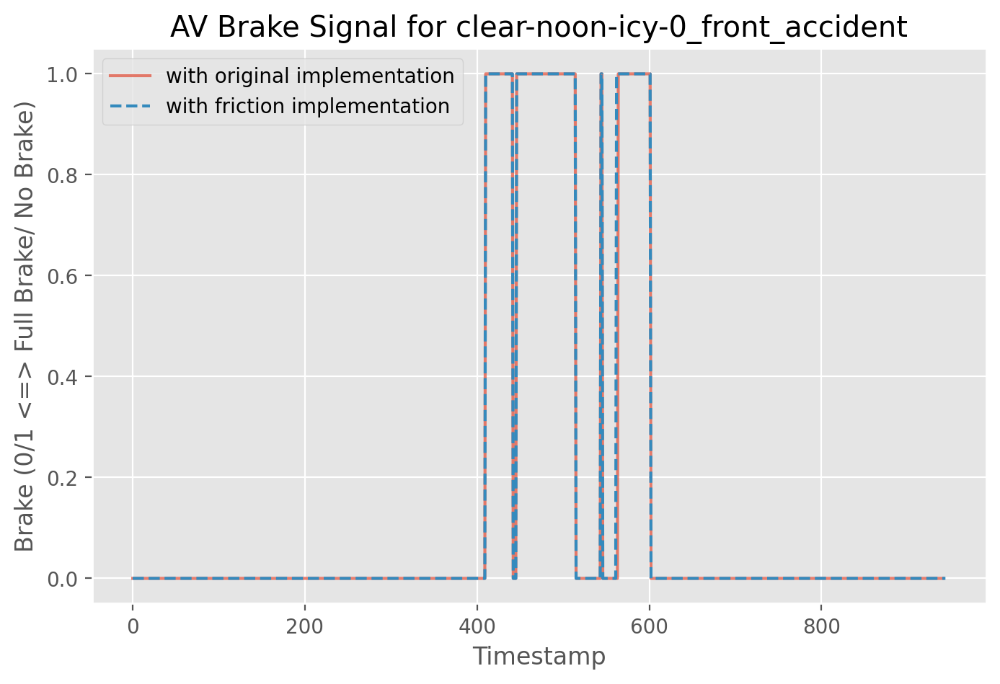

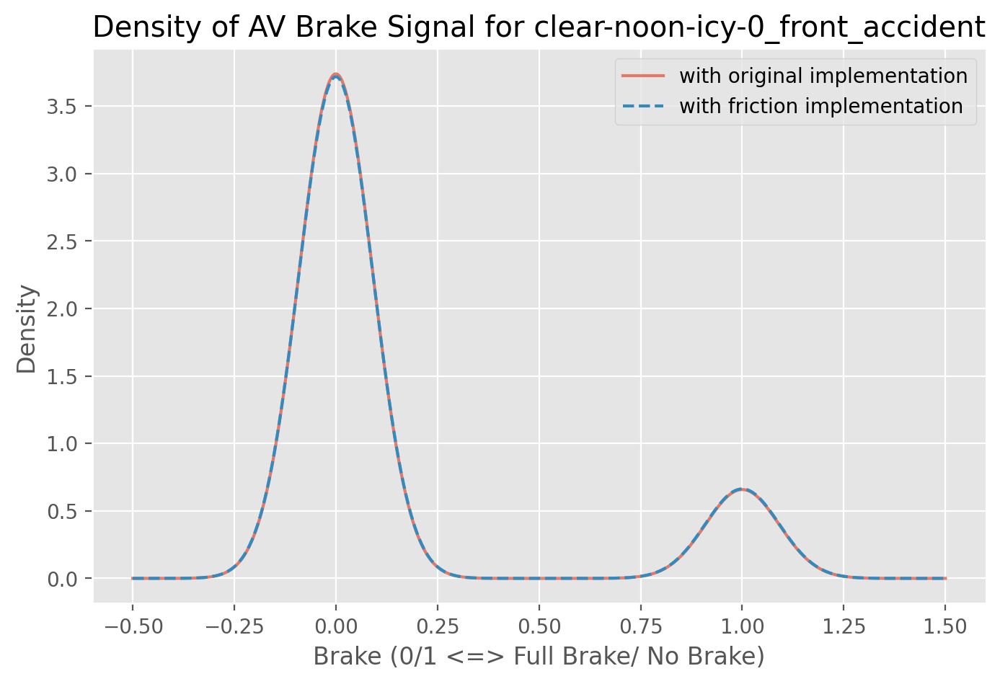

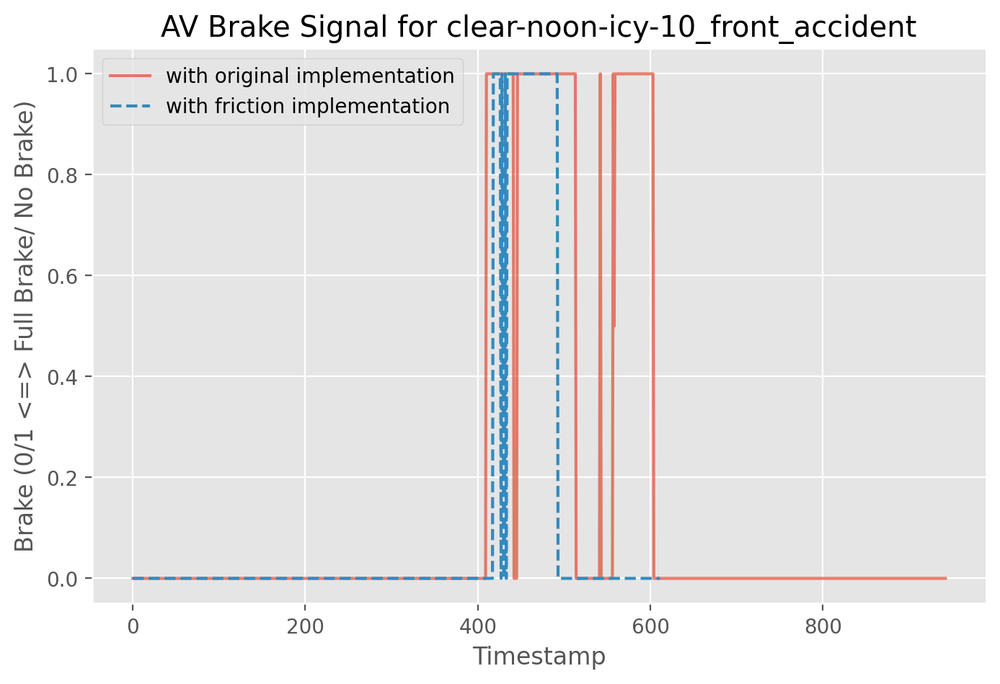

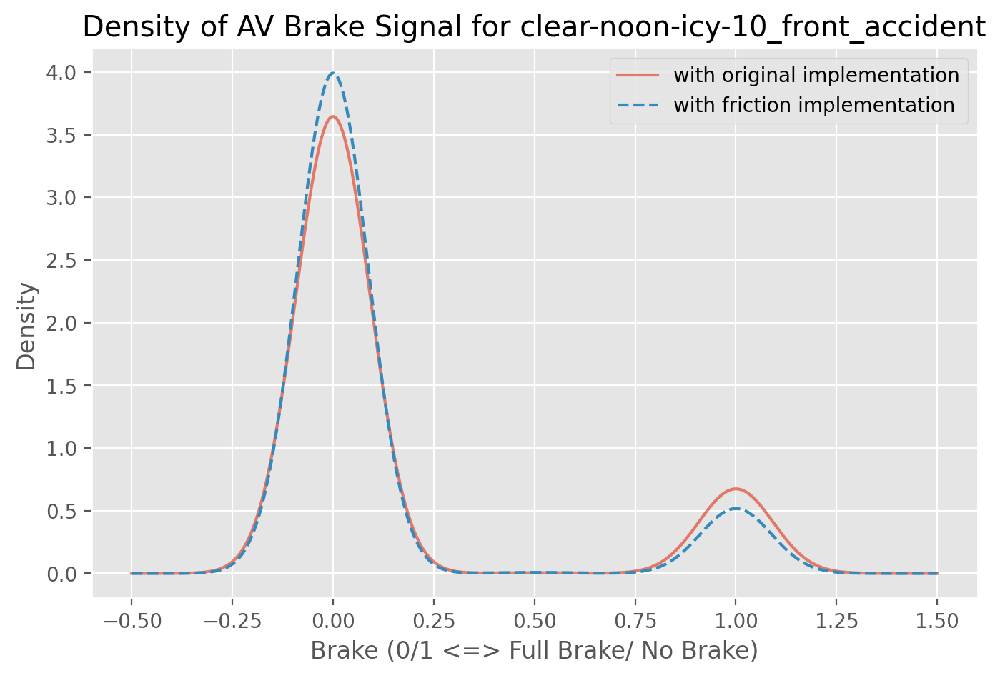

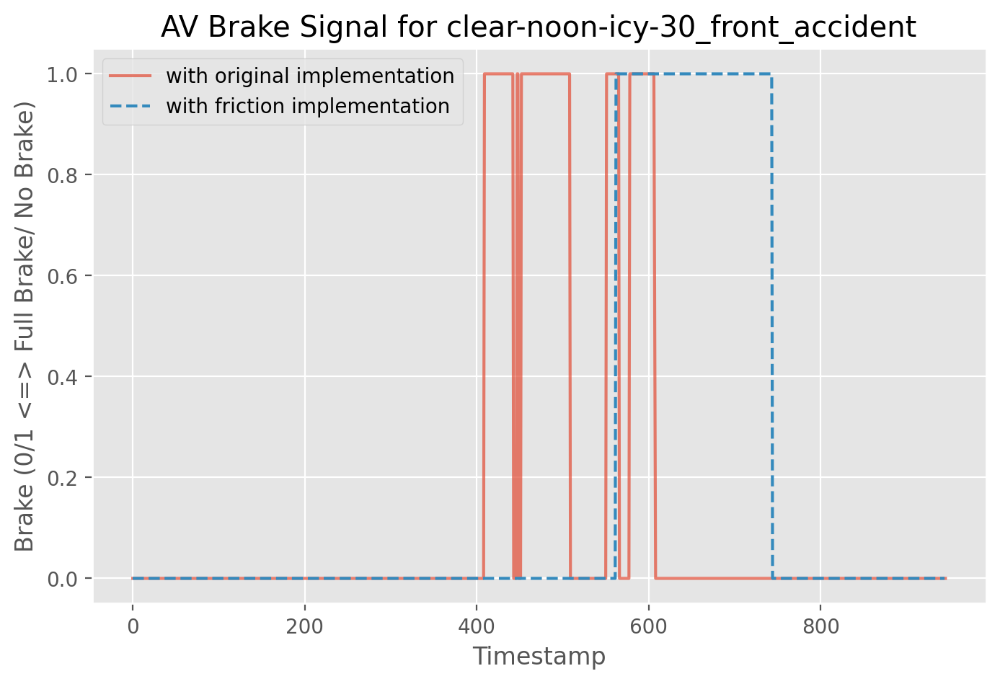

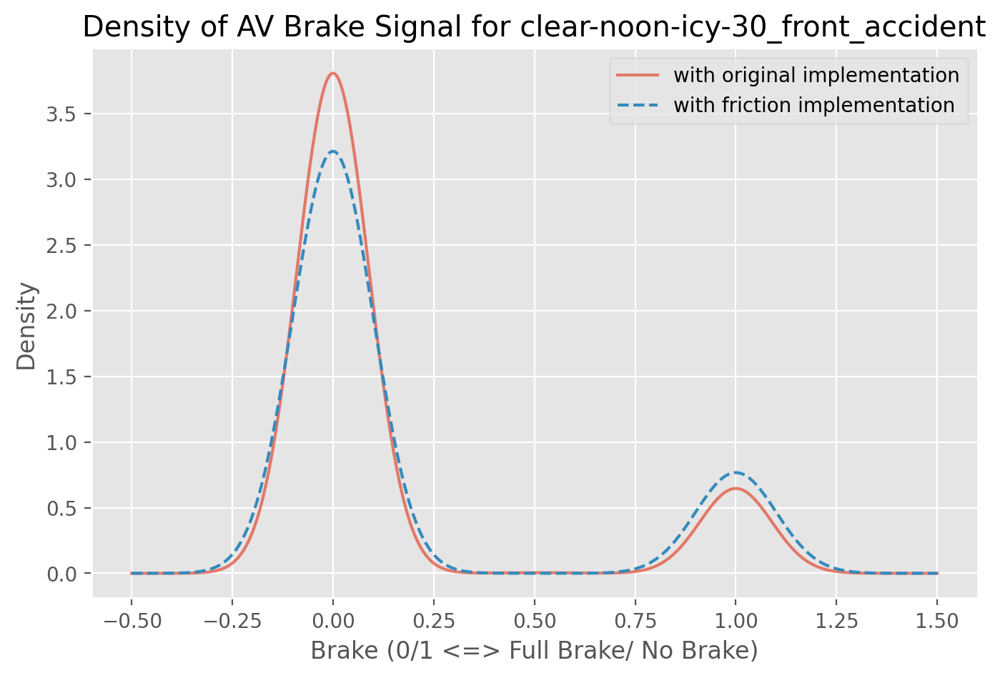

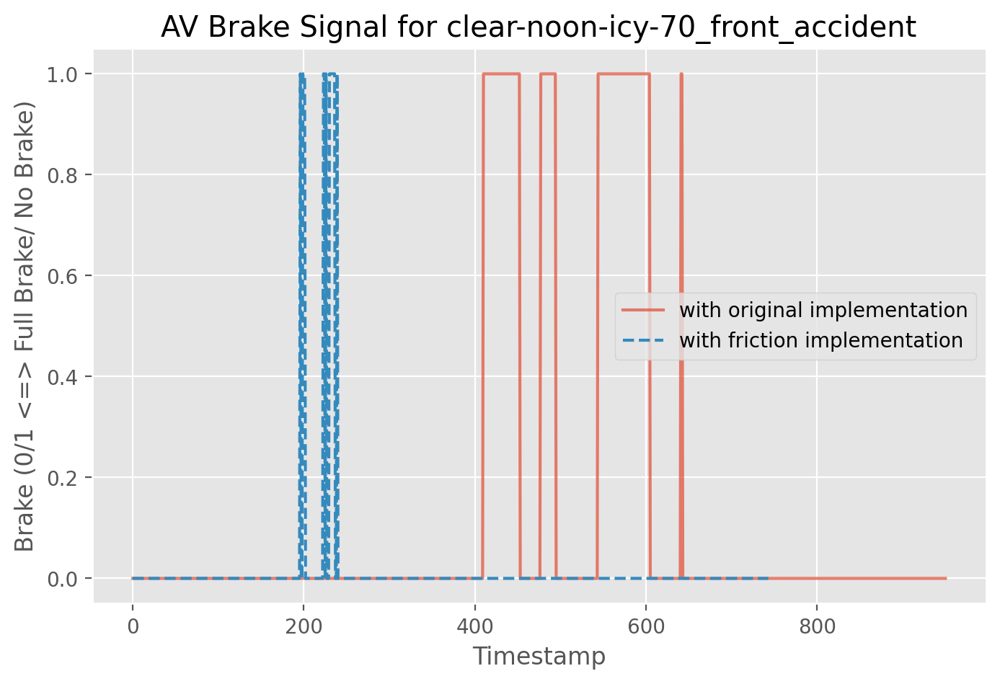

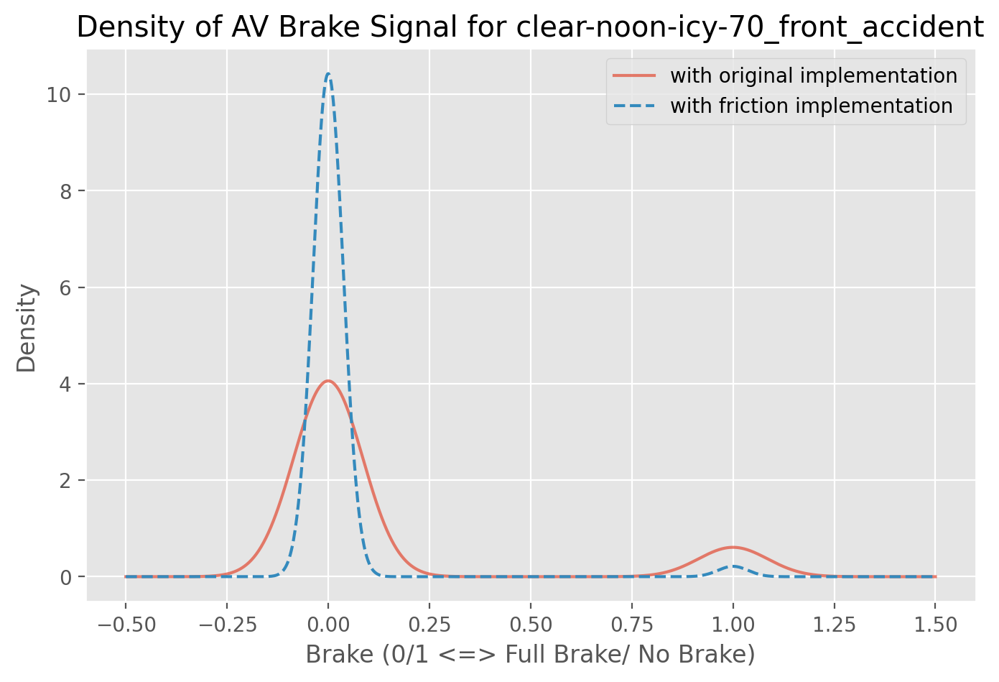

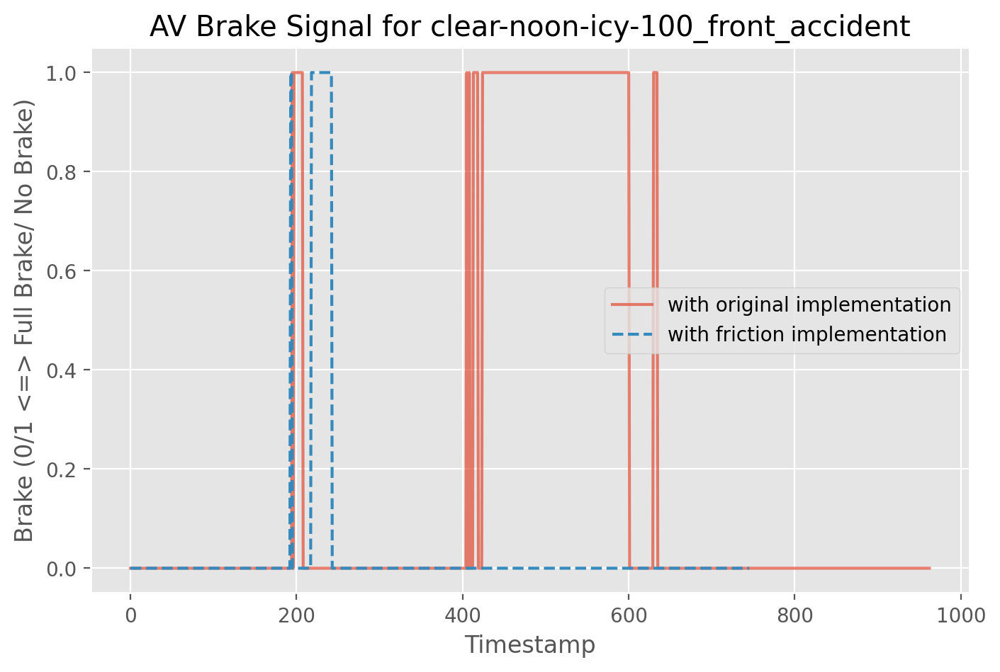

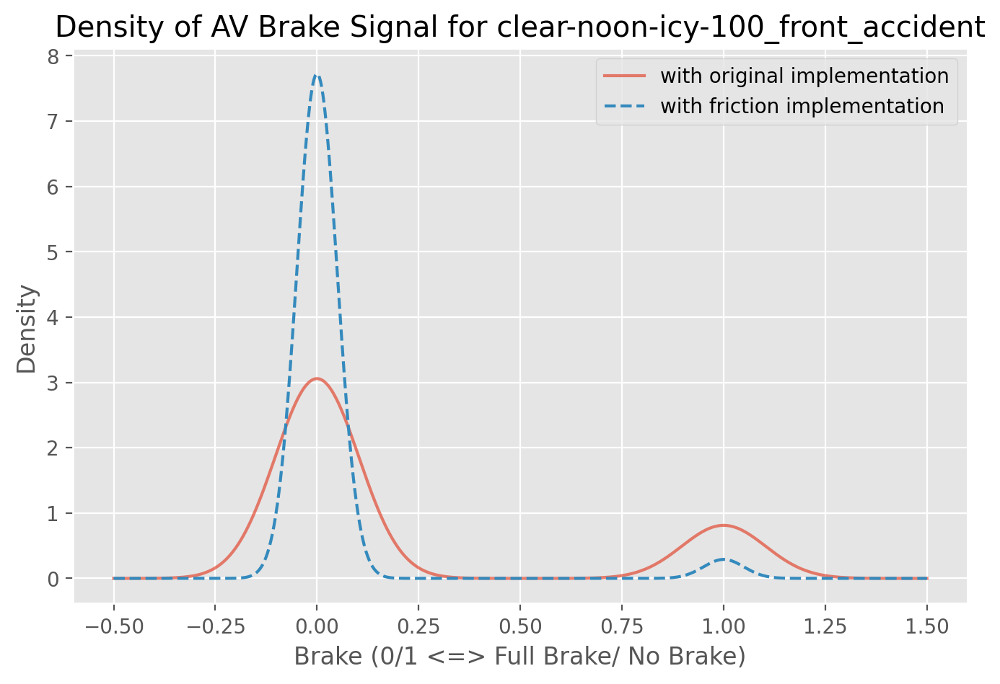

In [47]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)

    plt.plot(median_orig_brake, alpha=0.7)


    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any():
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)
    
    all_medians[weather][5][0] = median_orig_brake
    all_medians[weather][5][1] = median_fric_brake
    
    plt.plot(median_fric_brake, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
    plt.title("AV Brake Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Brake (0/1 <=> Full Brake/ No Brake)")
    plt.ylabel("Density")
    median_orig_brake.plot.density(alpha=0.7)
    median_fric_brake.plot.density(style='--')
    plt.title("Density of AV Brake Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()


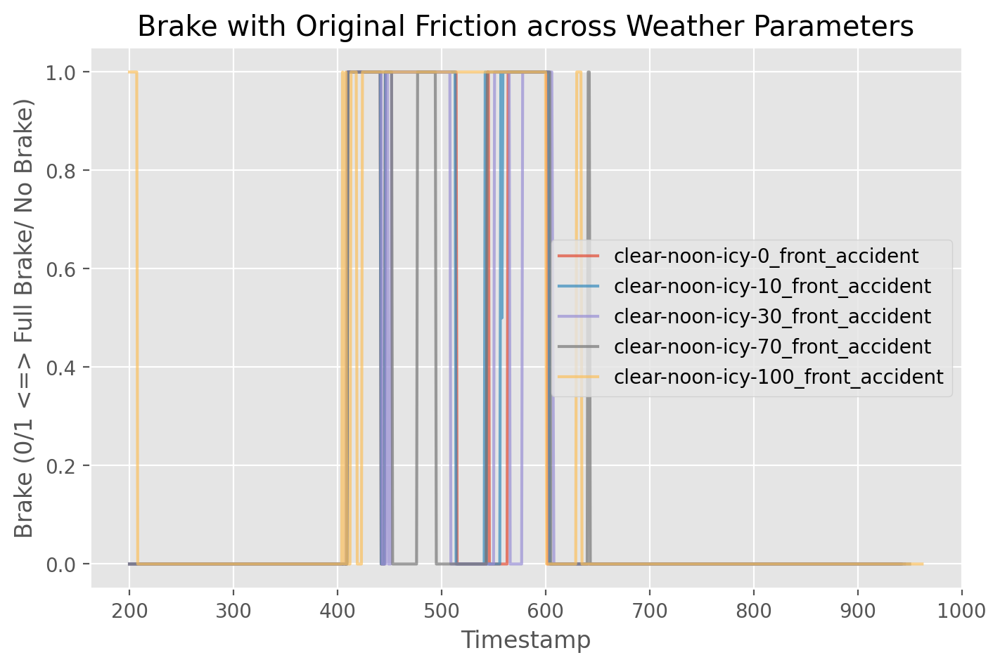

In [48]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'brake'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)


    plt.plot(median_orig_brake[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
plt.title("Brake with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

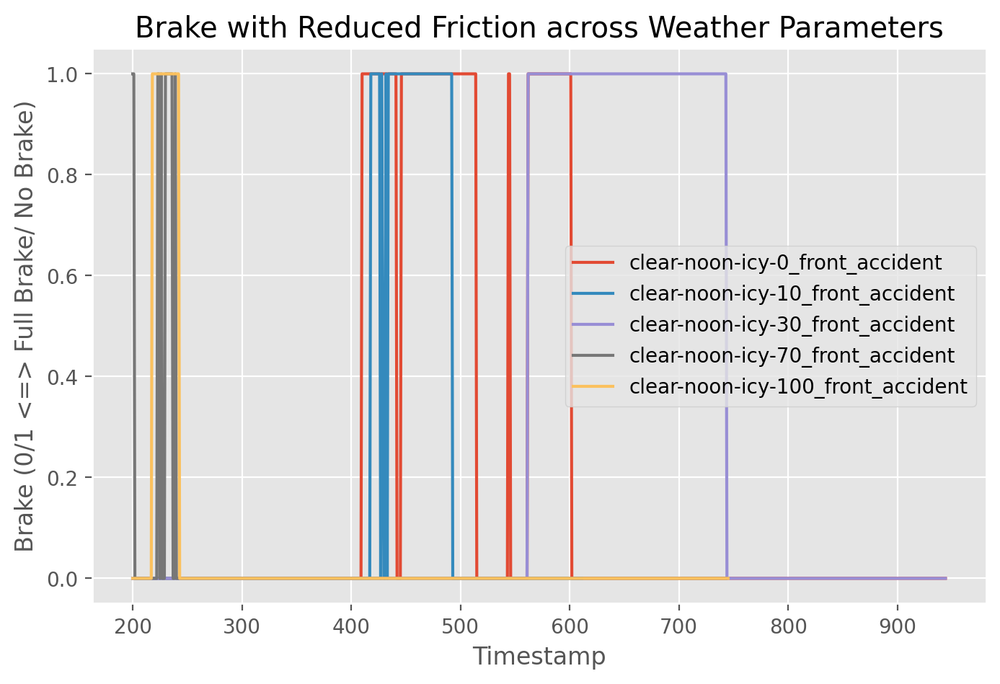

In [49]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any() :
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)

    plt.plot(median_fric_brake[200:])

plt.xlabel("Timestamp")
plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
plt.title("Brake with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

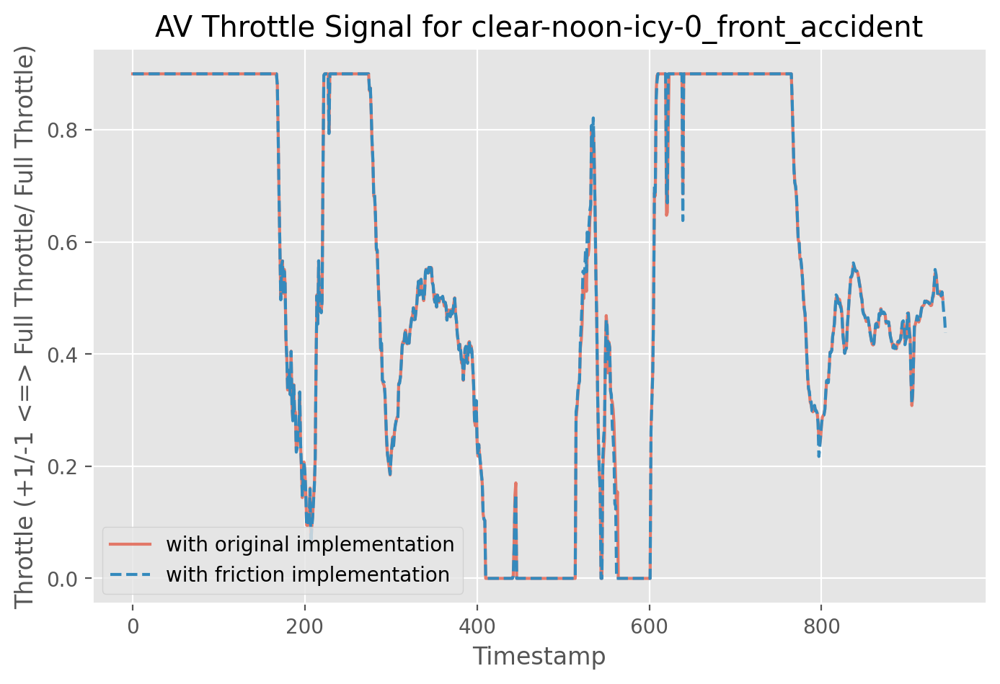

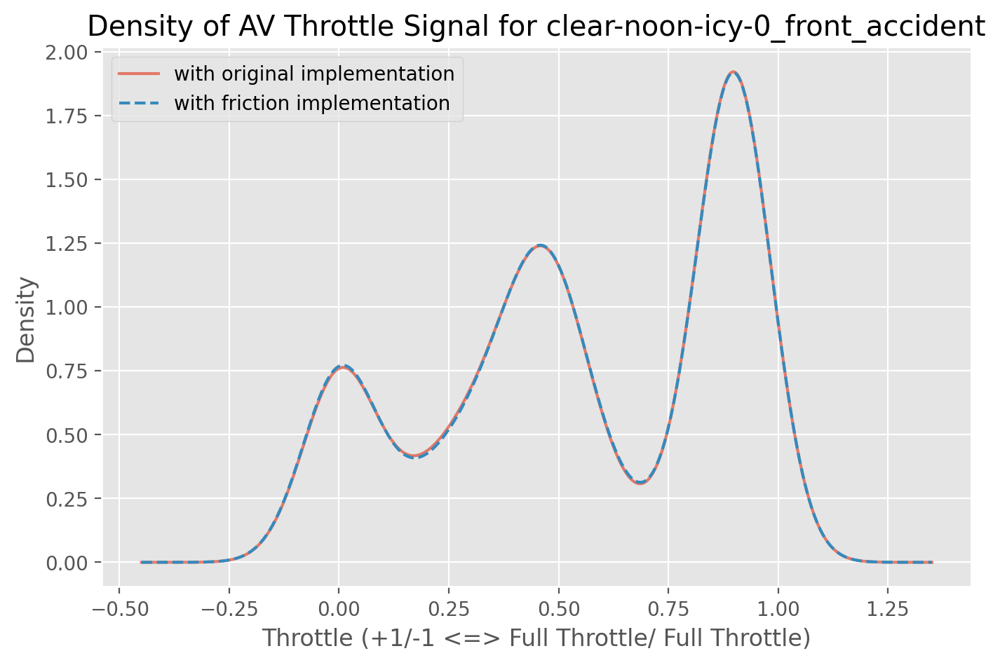

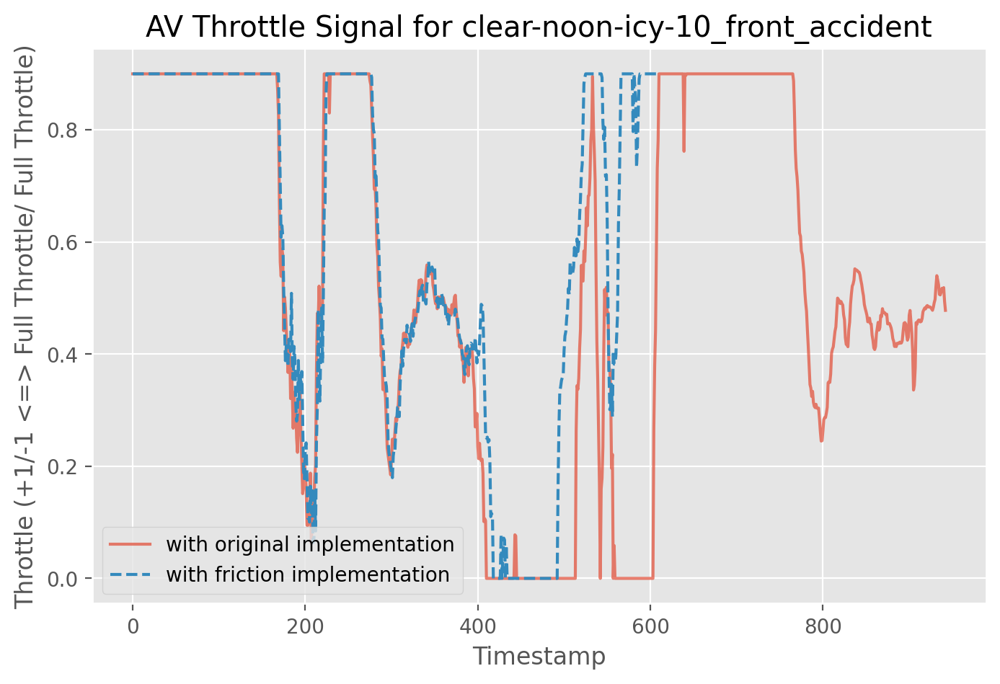

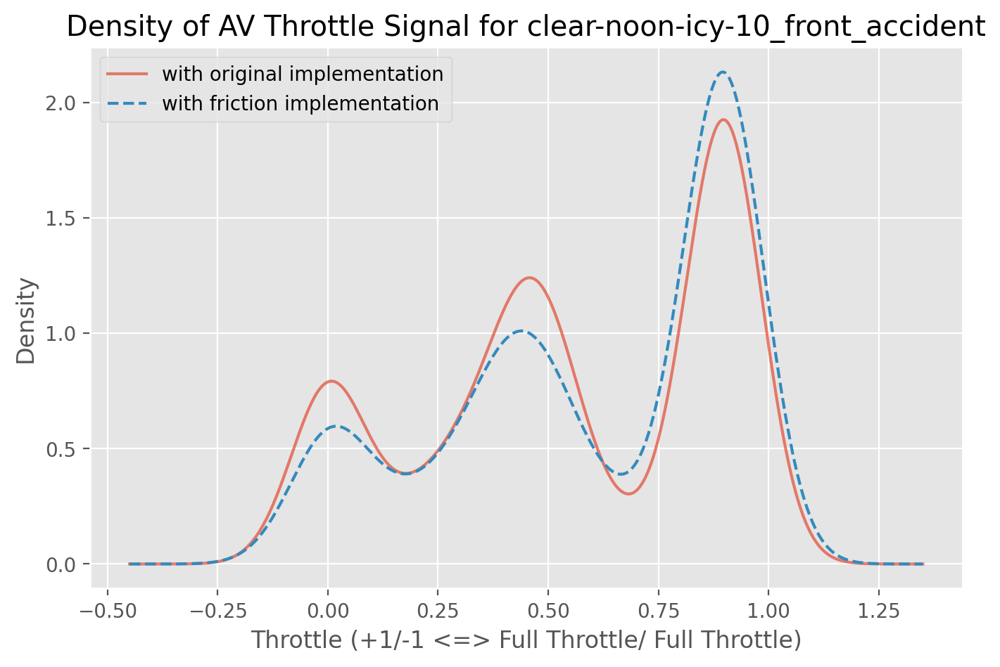

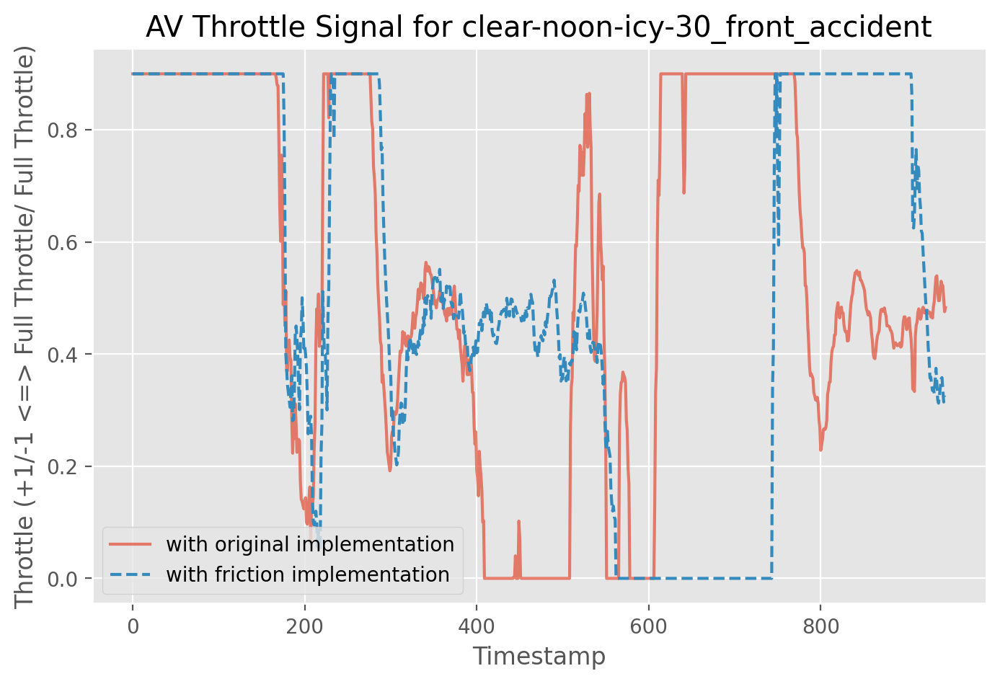

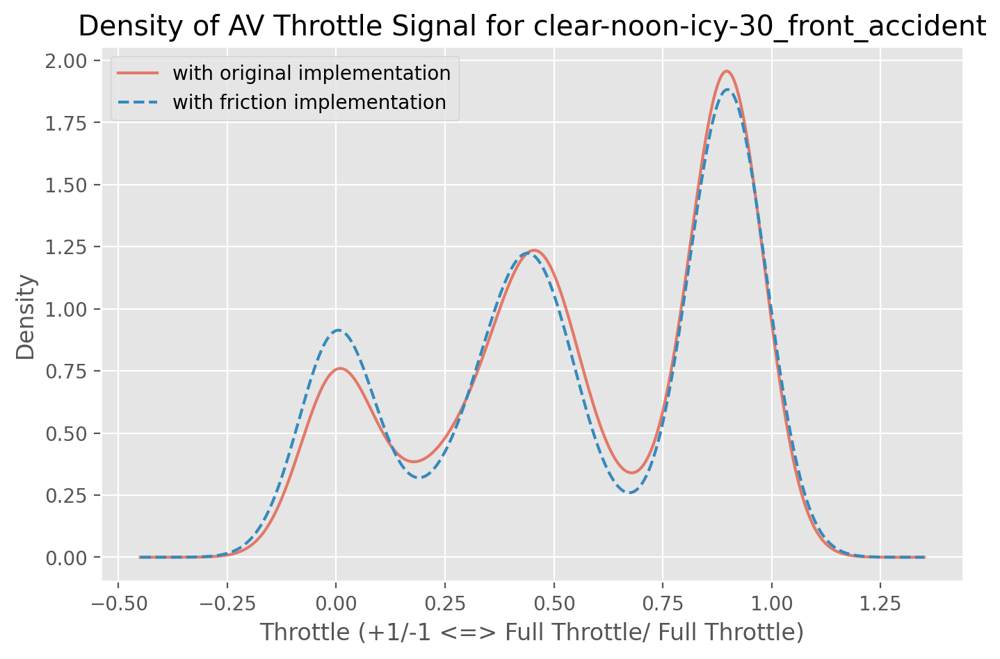

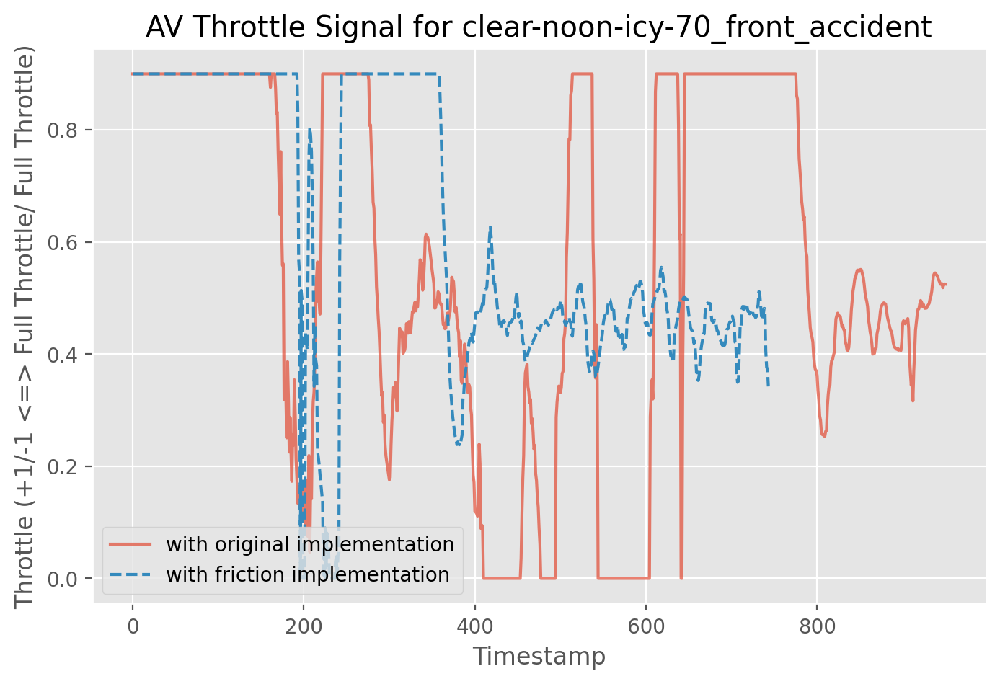

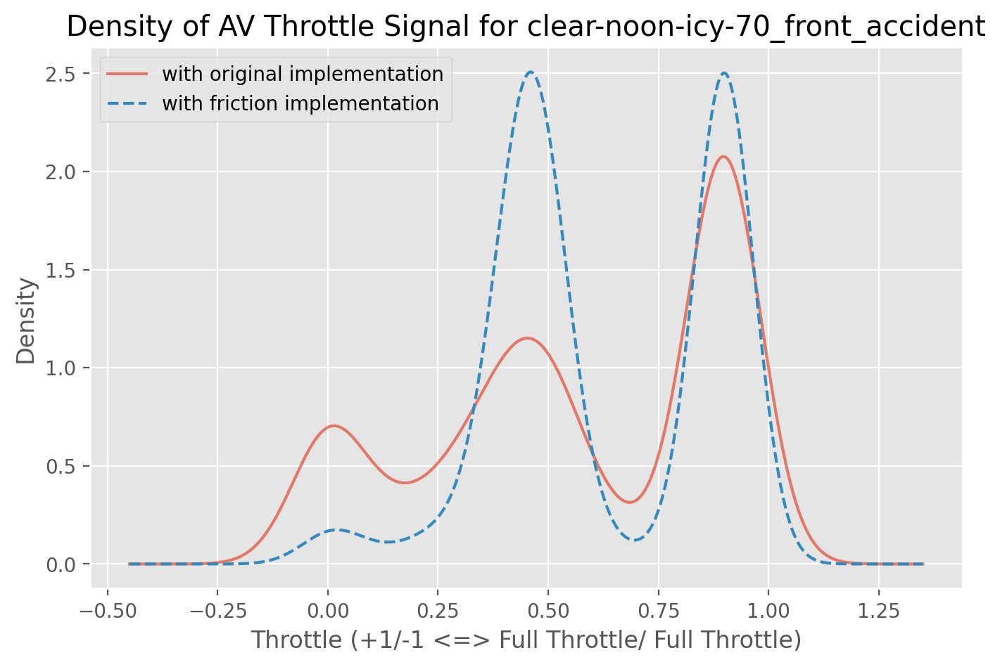

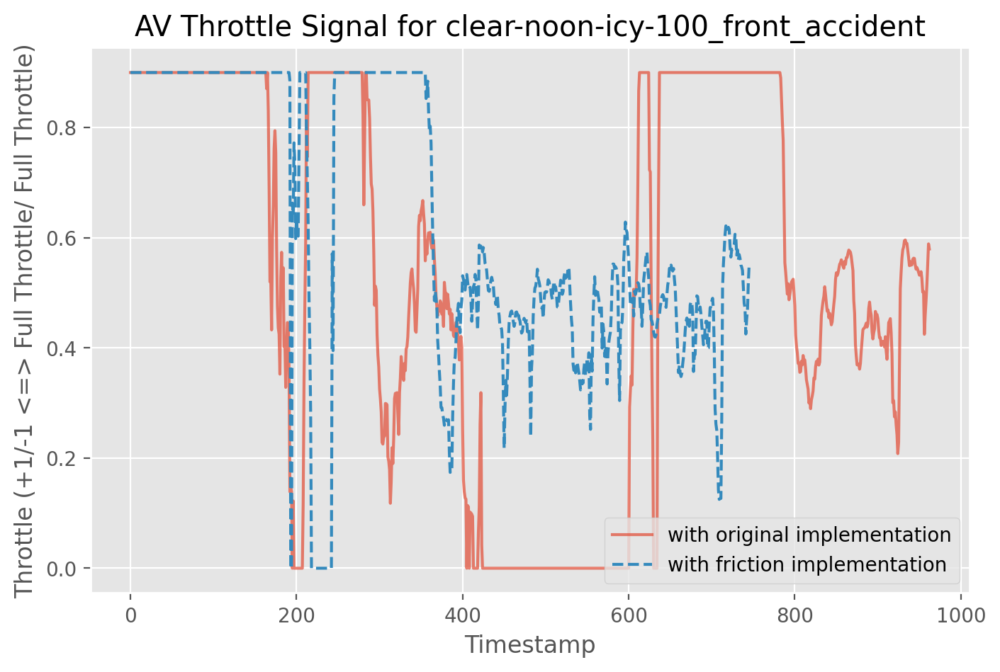

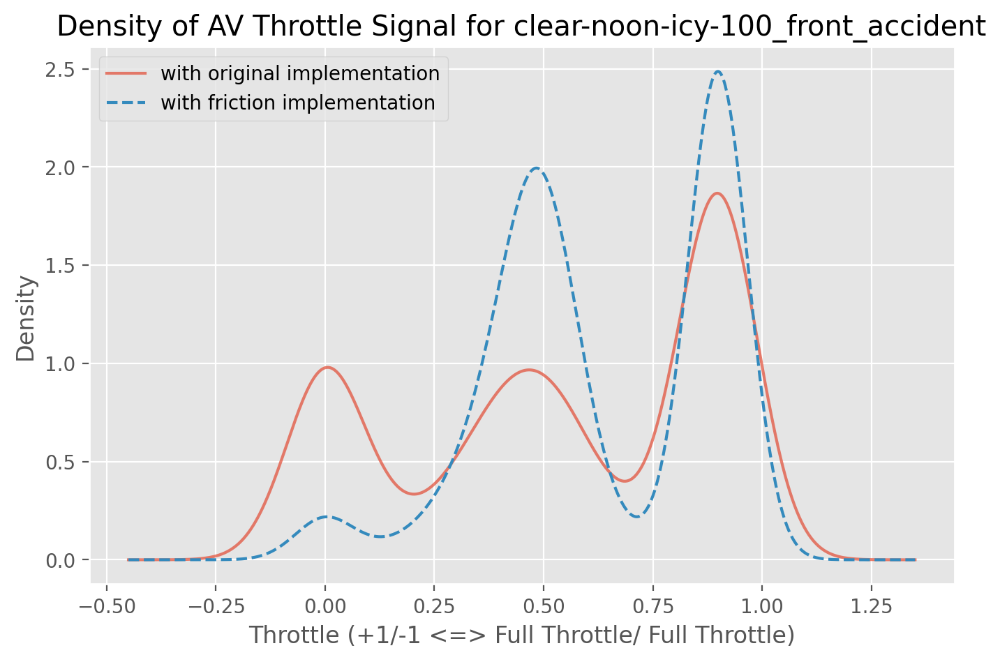

In [50]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)

    plt.plot(median_orig_throttle, alpha=0.7)


    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any():
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)
    
    all_medians[weather][6][0] = median_orig_throttle
    all_medians[weather][6][1] = median_fric_throttle
    
    plt.plot(median_fric_throttle, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
    plt.title("AV Throttle Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
    plt.ylabel("Density")
    median_orig_throttle.plot.density(alpha=0.7)
    median_fric_throttle.plot.density(style='--')
    plt.title("Density of AV Throttle Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

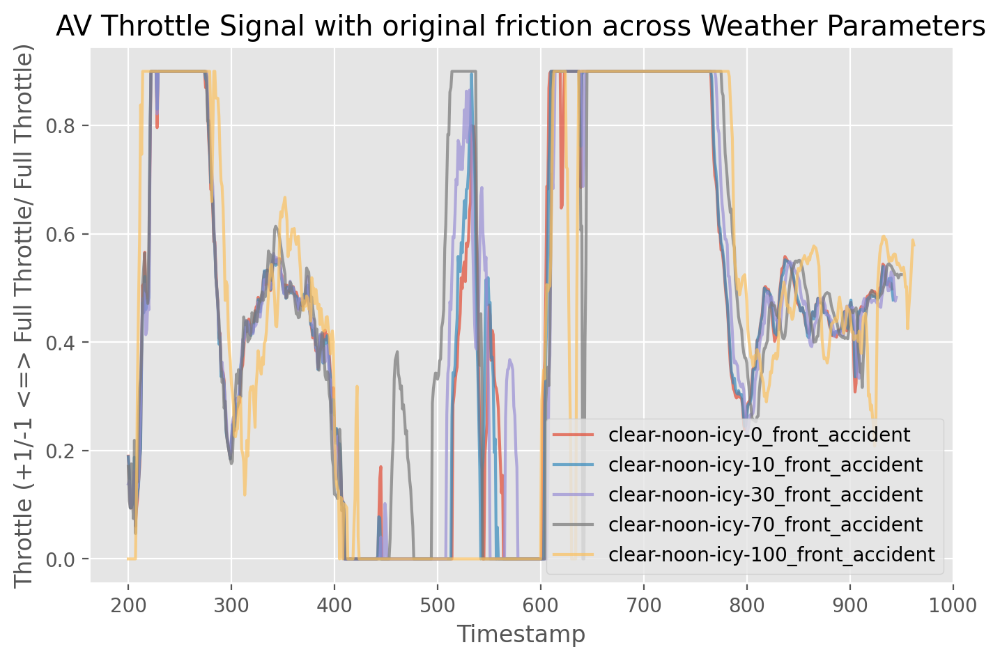

In [51]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'throttle'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)


    plt.plot(median_orig_throttle[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
plt.title("AV Throttle Signal with original friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

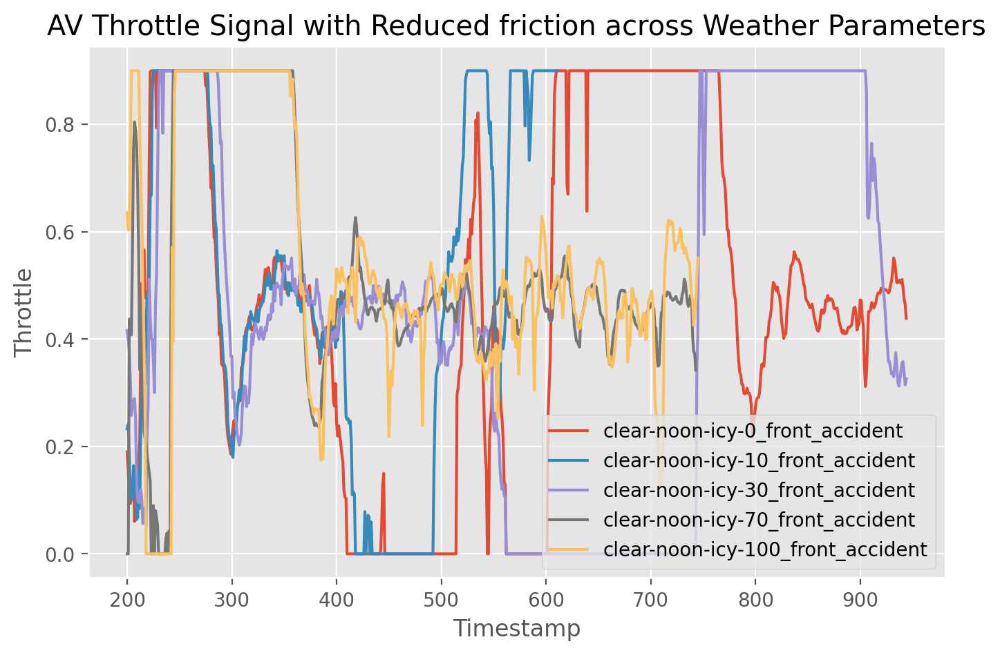

In [52]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any() :
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)

    plt.plot(median_fric_throttle[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with Reduced friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

## Dynamic time warping (DTW) for cvip
### measuring similarity between two temporal sequences

In [53]:
all_dtw = [[0] * len(attribute_order)  for i in range(len(txt_lists_fric))]

for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = dtw.distance(all_medians[i][j][0], all_medians[i][j][1])

In [54]:
for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = round(all_dtw[i][j],2)

In [55]:
df = pd.DataFrame(all_dtw, columns = attribute_order, dtype = float)
df.index = subfolders
df.to_csv("DTW_front_accident_icy.csv")
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_front_accident,0.01,0.69,0.31,0.46,0.01,0.00,0.19
clear-noon-icy-10_front_accident,4.24,467.00,84.09,341.81,0.12,0.71,3.38
clear-noon-icy-30_front_accident,0.91,2.33,6.63,87.65,0.10,7.16,2.85
clear-noon-icy-70_front_accident,0.28,1.98,75.22,148.66,0.33,1.41,4.07
clear-noon-icy-100_front_accident,0.17,2.08,76.52,117.54,0.26,3.61,3.00


## KS Test for cvip

In [56]:
import scipy as sp

In [57]:
all_ks = np.empty((len(txt_lists_fric), len(attribute_order), 2))
# [[0] * len(attribute_order)  for i in range(len(txt_lists_fric)-1)]
for i in range(len(txt_lists_fric)-1):
    for j in range(len(attribute_order)):
        ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])
        all_ks[i][j][0] = ks_test.pvalue
        all_ks[i][j][1] = ks_test.statistic

In [58]:
df = pd.DataFrame(all_ks[:,:,0], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_front_accident,2.080514e-03,2.295710e-02,9.989859e-01,6.212290e-01,9.901980e-01,1.000000e+00,1.000000e+00
clear-noon-icy-10_front_accident,1.945744e-101,5.568143e-22,2.766181e-05,3.330524e-08,2.193538e-10,5.271313e-01,2.239070e-03
clear-noon-icy-30_front_accident,3.171863e-33,8.006329e-27,1.247728e-03,2.359530e-06,6.528482e-13,2.231266e-01,2.229327e-01
clear-noon-icy-70_front_accident,6.974000e-14,1.102135e-12,1.510537e-20,4.382023e-30,4.889033e-16,7.042655e-05,2.135244e-14
clear-noon-icy-100_front_accident,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311


In [59]:
df = pd.DataFrame(all_ks[:,:,1], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_front_accident,8.477741e-02,6.827756e-02,1.672564e-02,3.421292e-02,1.975533e-02,1.641223e-03,6.952448e-03
clear-noon-icy-10_front_accident,5.440085e-01,2.566278e-01,1.220846e-01,1.544958e-01,1.748002e-01,4.150639e-02,9.506234e-02
clear-noon-icy-30_front_accident,2.804244e-01,2.520443e-01,8.789669e-02,1.194492e-01,1.733537e-01,4.777230e-02,4.778572e-02
clear-noon-icy-70_front_accident,1.915980e-01,1.828932e-01,2.340278e-01,2.836064e-01,2.063024e-01,1.102278e-01,1.952105e-01
clear-noon-icy-100_front_accident,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311,1.169061e-311
